# Titanic Survival Prediction

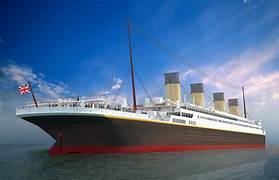

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
import plotly.graph_objects as go

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
df=pd.read_csv("C:/Users/nihar/Downloads/Titanic_Dataset.csv")

In [6]:
df

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [7]:
df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [8]:
df.tail()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.00,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.00,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.45,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.00,C148,C
890,891,0,3,"Dooley, Mr. Patrick",male,32.0,0,0,370376,7.75,NaN,Q


In [9]:
df.shape

(891, 12)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [11]:
df.duplicated().sum()

0

In [12]:
df.isnull().sum()

PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Cabin          687
Embarked         2
dtype: int64

In [13]:
df=df.drop('Cabin',axis=1)

In [14]:
df=df.drop(['PassengerId','Name','Ticket'],axis=1)

In [15]:
df

,Survived,Pclass,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,3,male,22.0,1,0,7.2500,S
1,1,1,female,38.0,1,0,71.2833,C
2,1,3,female,26.0,0,0,7.9250,S
3,1,1,female,35.0,1,0,53.1000,S
4,0,3,male,35.0,0,0,8.0500,S
...,...,...,...,...,...,...,...,...
886,0,2,male,27.0,0,0,13.0000,S
887,1,1,female,19.0,0,0,30.0000,S
888,0,3,female,NaN,1,2,23.4500,S
889,1,1,male,26.0,0,0,30.0000,C


In [16]:
df.columns

Index(['Survived', 'Pclass', 'Sex', 'Age', 'SibSp', 'Parch', 'Fare',
       'Embarked'],
      dtype='object')

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    object 
 3   Age       714 non-null    float64
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Fare      891 non-null    float64
 7   Embarked  889 non-null    object 
dtypes: float64(2), int64(4), object(2)
memory usage: 55.8+ KB


# Data Imputation

In [18]:
object_columns=df.select_dtypes(include='object').columns.tolist()
numerical_columns=df.select_dtypes(include=['int', 'float']).columns.tolist()
print("object columns:", object_columns)
print('\n')
print("numerical columns:",numerical_columns)

object columns: ['Sex', 'Embarked']


numerical columns: ['Survived', 'Pclass', 'Age', 'SibSp', 'Parch', 'Fare']


In [19]:
for feature in numerical_columns:
    df[feature].fillna(df[feature].mean(),inplace=True)
for feature in object_columns:
    df[feature].fillna(df[feature].mode()[0] ,inplace=True)

In [20]:
df.isnull().sum()

Survived    0
Pclass      0
Sex         0
Age         0
SibSp       0
Parch       0
Fare        0
Embarked    0
dtype: int64

In [21]:
df.nunique()

Survived      2
Pclass        3
Sex           2
Age          89
SibSp         7
Parch         7
Fare        248
Embarked      3
dtype: int64

In [22]:
df.describe()

,Survived,Pclass,Age,SibSp,Parch,Fare
count,891.000000,891.000000,891.000000,891.000000,891.000000,891.000000
mean,0.383838,2.308642,29.699118,0.523008,0.381594,32.204208
std,0.486592,0.836071,13.002015,1.102743,0.806057,49.693429
min,0.000000,1.000000,0.420000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,22.000000,0.000000,0.000000,7.910400
50%,0.000000,3.000000,29.699118,0.000000,0.000000,14.454200
75%,1.000000,3.000000,35.000000,1.000000,0.000000,31.000000
max,1.000000,3.000000,80.000000,8.000000,6.000000,512.329200


# Data Visualization

Countplot: Sex


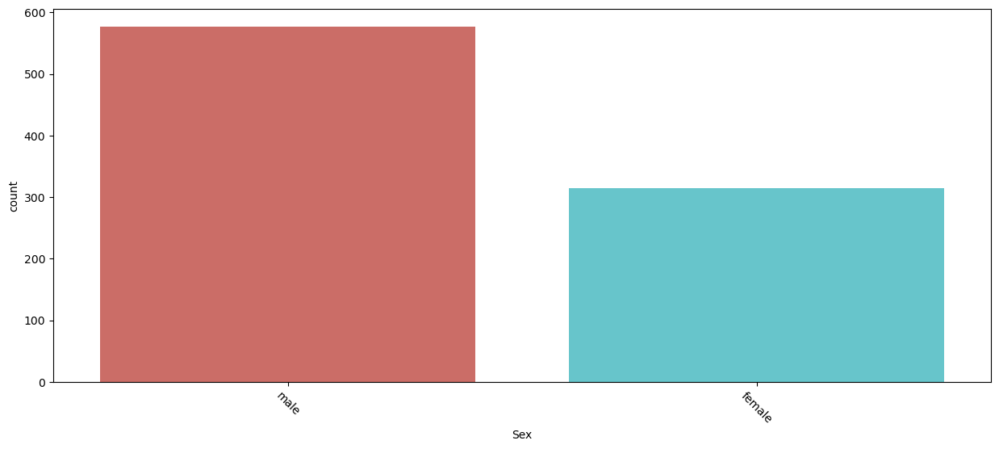



Countplot: Embarked


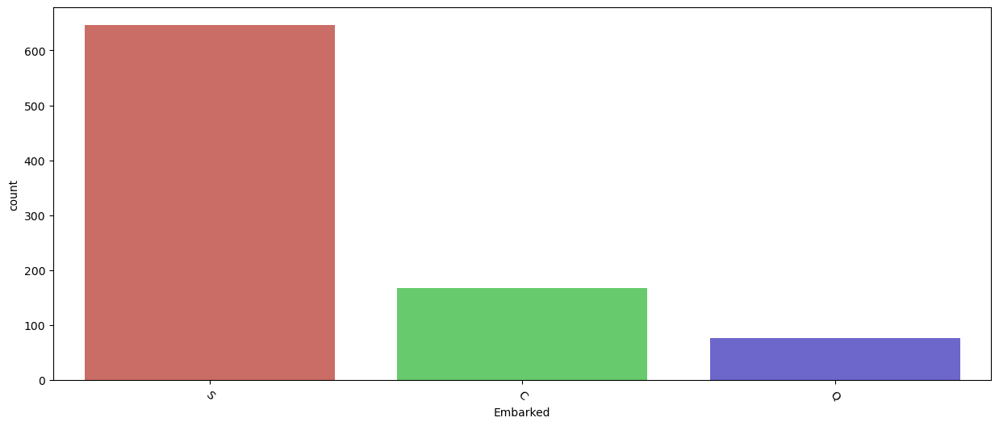

In [23]:
for i in object_columns:
    print('Countplot:', i)
    plt.figure(figsize=(15,6))
    sns.countplot(x = df[i], data = df, palette = 'hls')
    plt.xticks(rotation= -45)
    plt.show()
    print('\n')

pie plot for: Sex


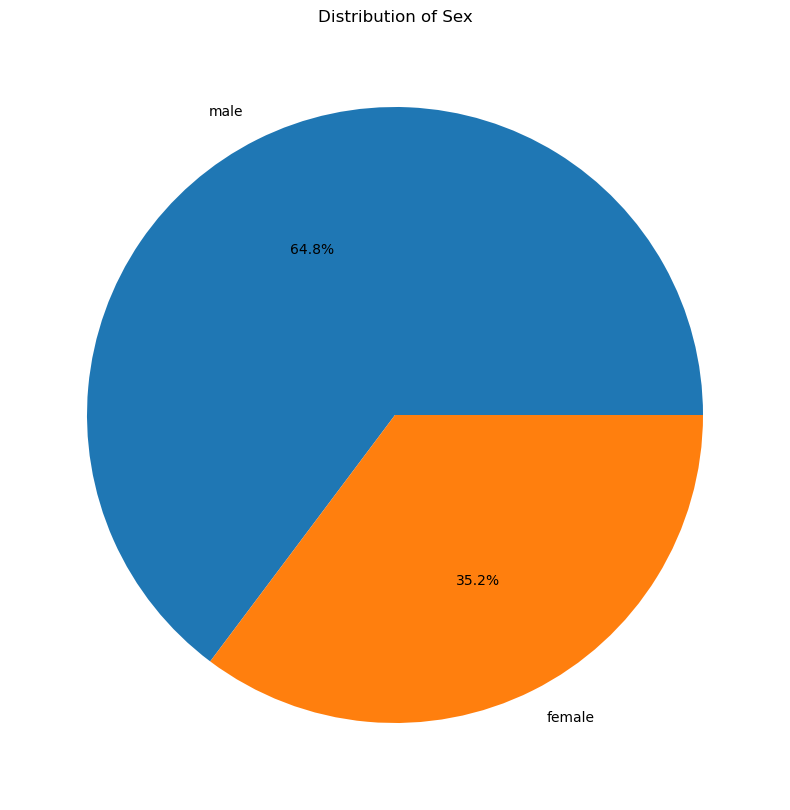



pie plot for: Embarked


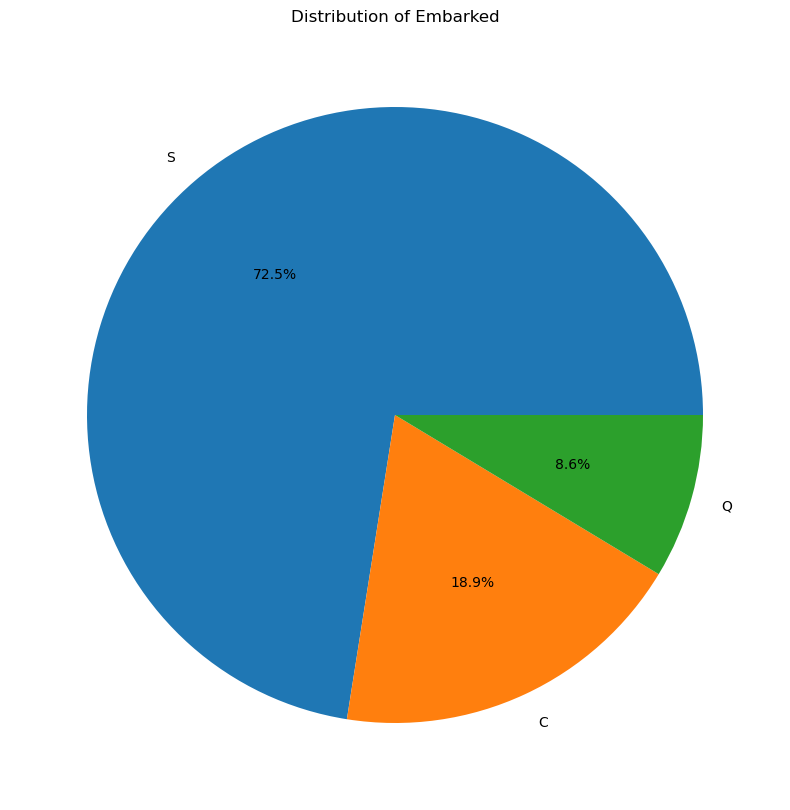

In [24]:
for i in object_columns:
    print('pie plot for:', i)
    plt.figure(figsize=(20,10))
    df[i].value_counts().plot(kind='pie', autopct='%1.1f%%')
    plt.title('Distribution of ' + i)
    plt.ylabel('')
    plt.show()
    print('\n')

In [25]:
for i in object_columns:
    fig = go.Figure(data=[go.Bar(x=df[i].value_counts().index, 
                                 y=df[i].value_counts())])
    fig.update_layout(
                title=i,xaxis_title=i,yaxis_title="Count")
    fig.show()

In [27]:
for i in object_columns:
    print('Pie plot for:', i)
    fig=px.pie(df, names=i, title='Distribution of ' + i)
    fig.show()
    print('\n')

Pie plot for: Sex




Pie plot for: Embarked


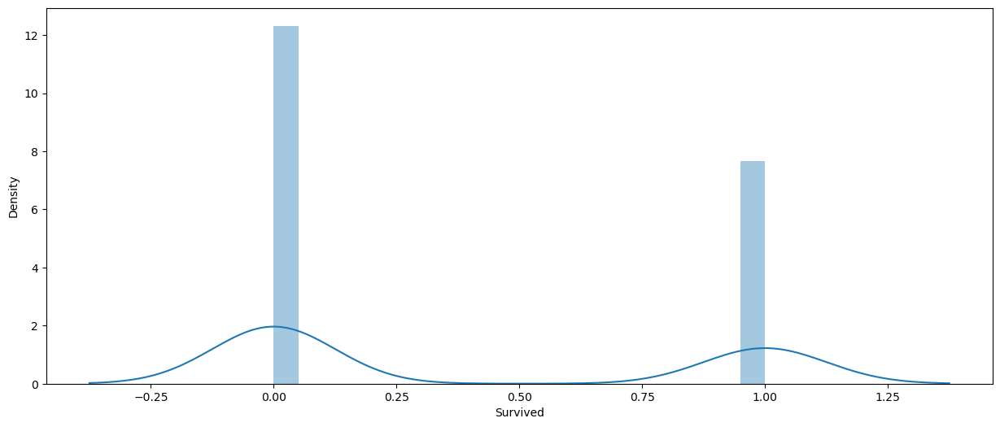

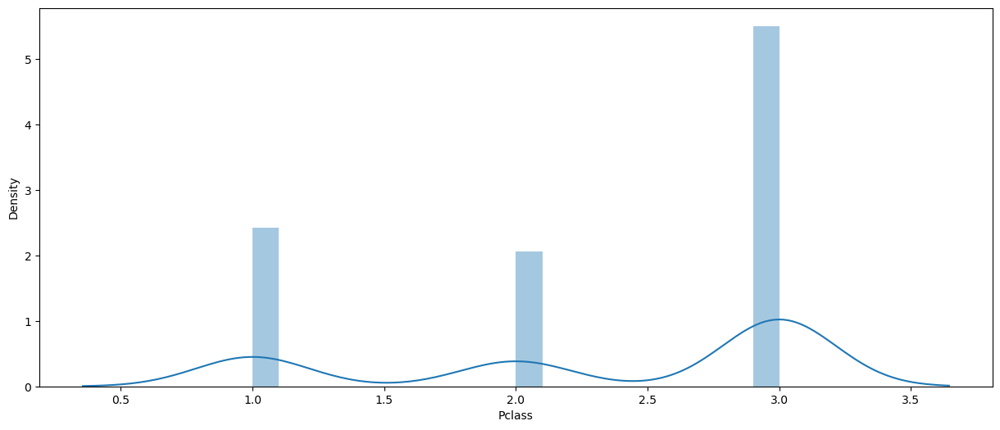

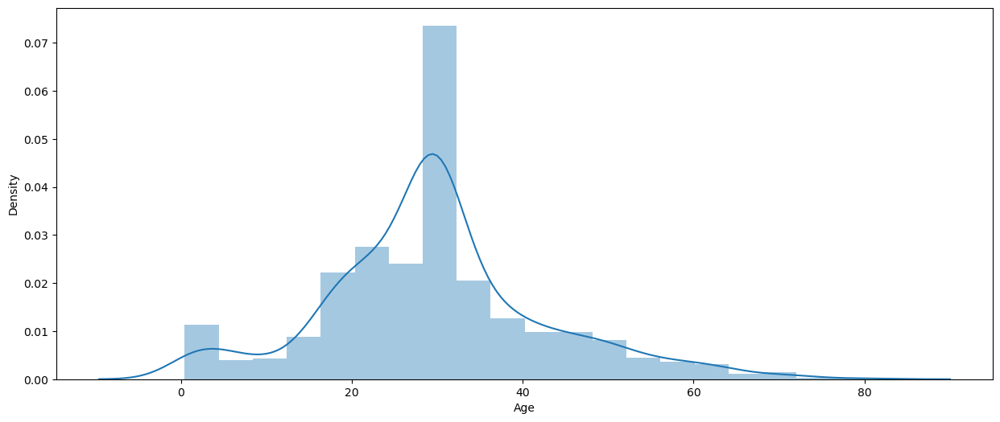

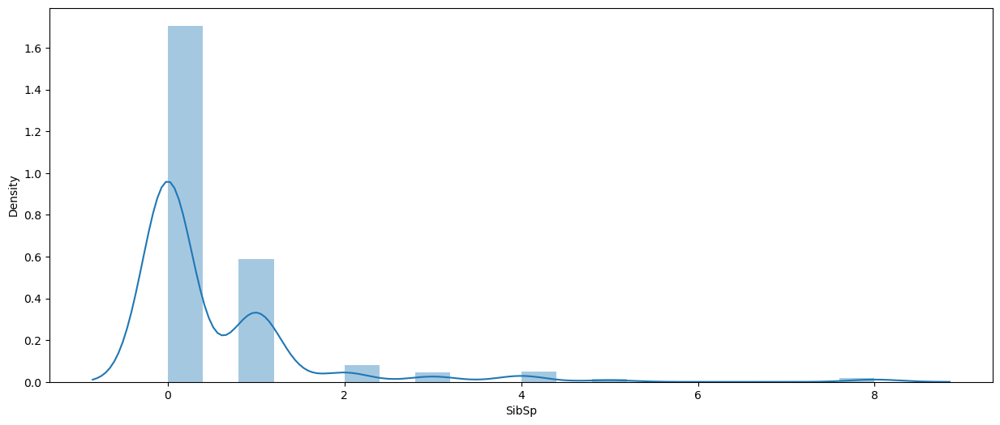

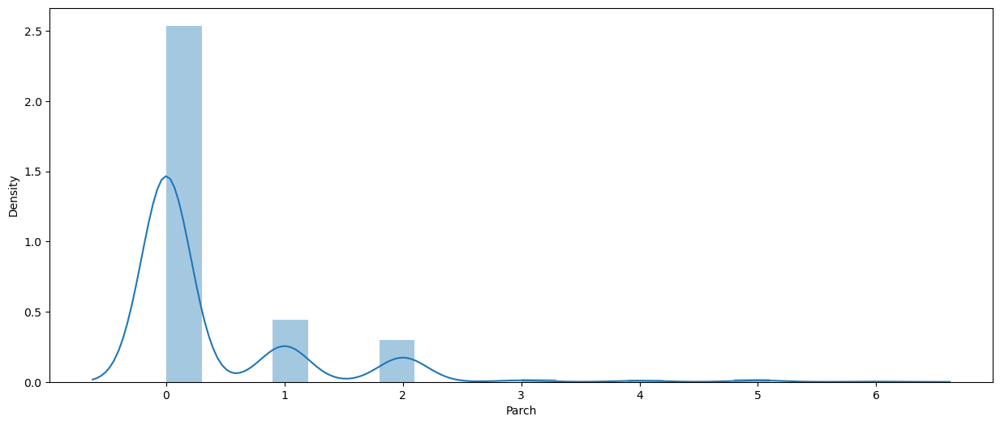

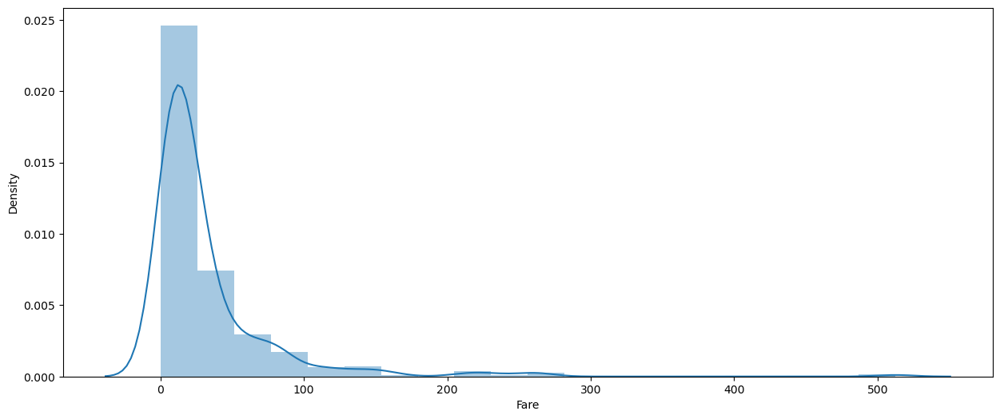

In [26]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.distplot(df[i], kde =True, bins=20)
    plt.xticks(rotation = 0)
    plt.show()

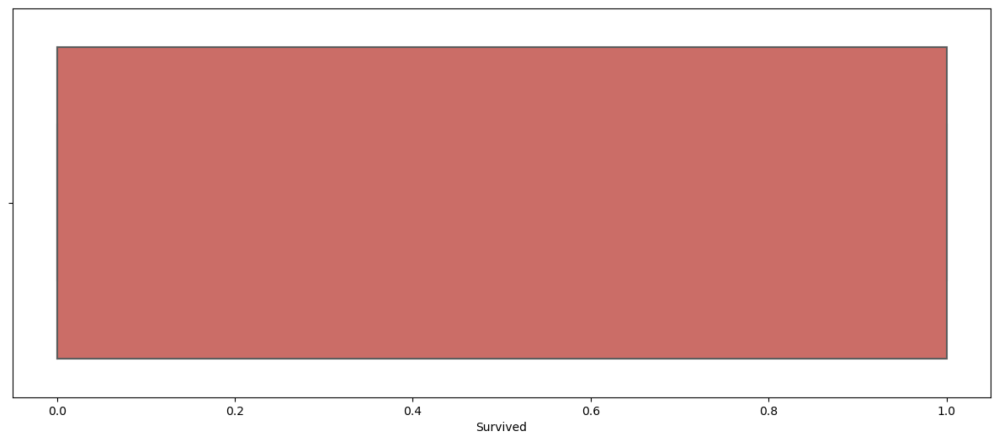

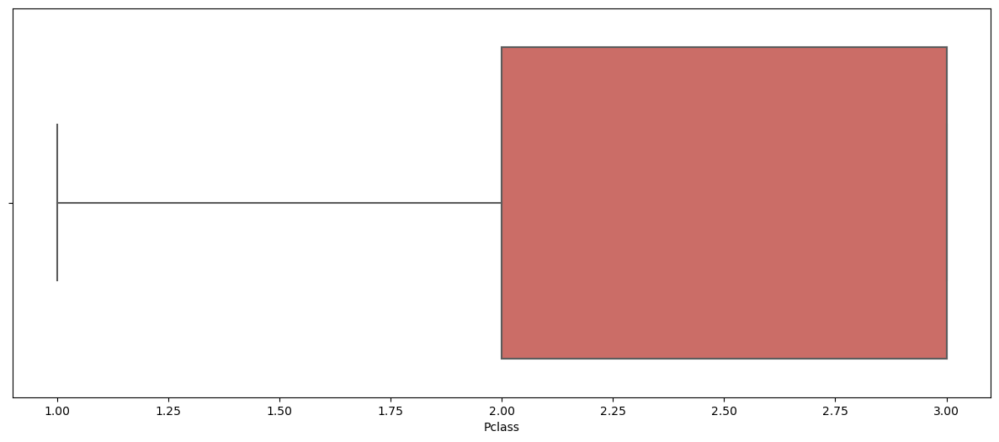

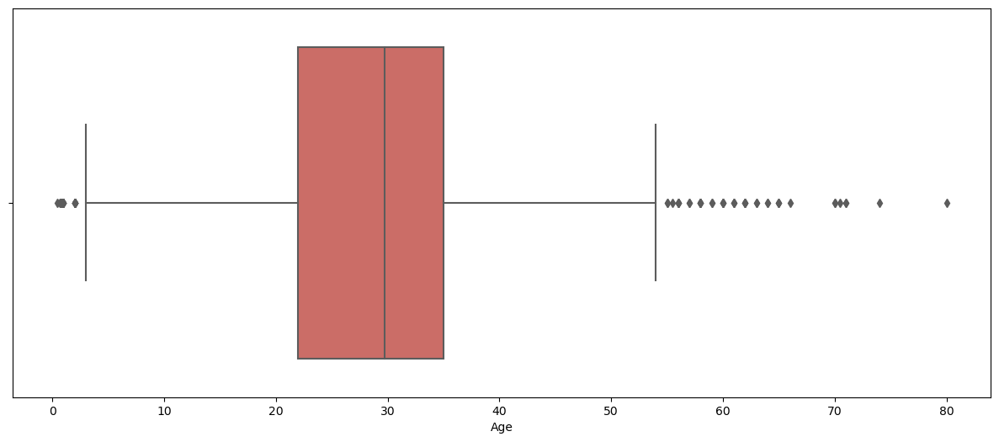

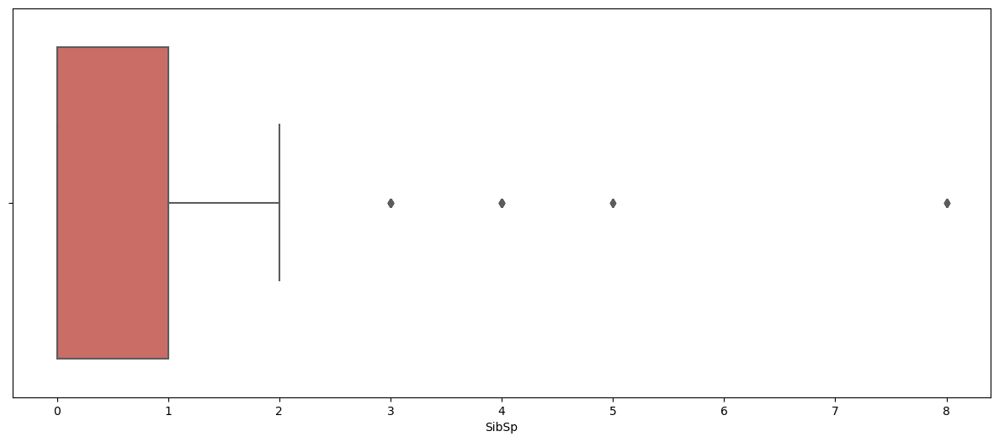

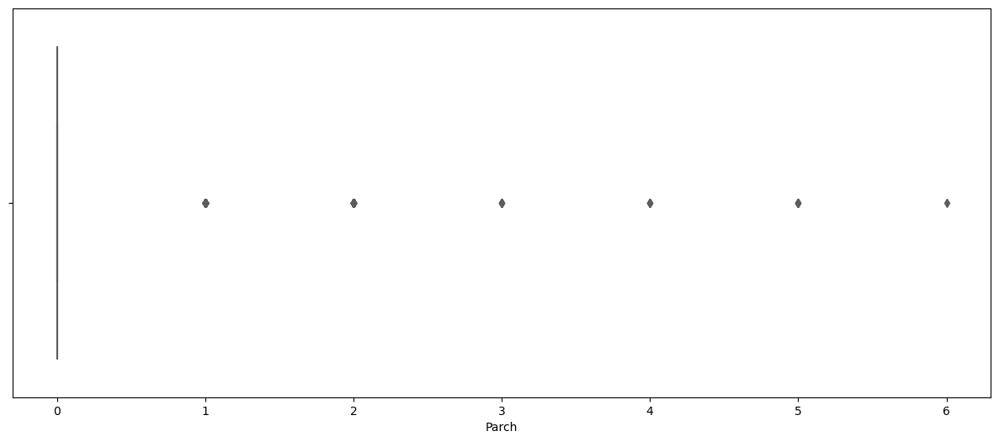

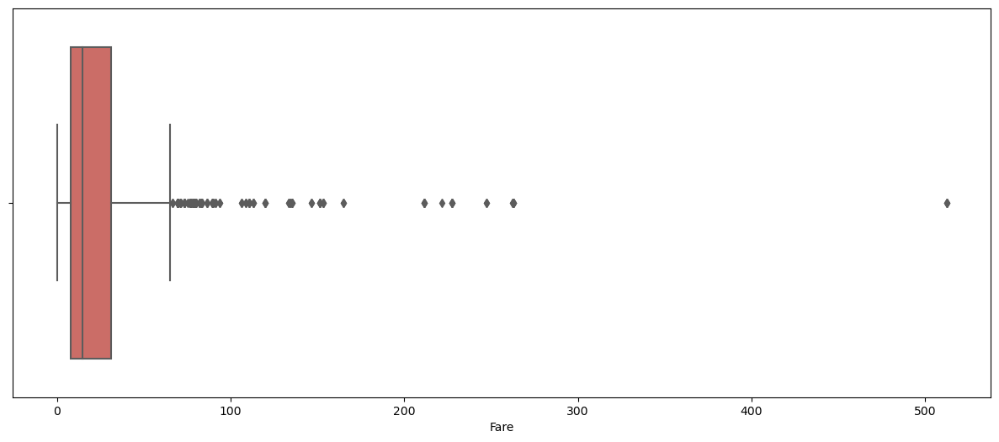

In [27]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.boxplot(x=i,data=df, palette='hls')
    plt.xticks(rotation = 0)
    plt.show()

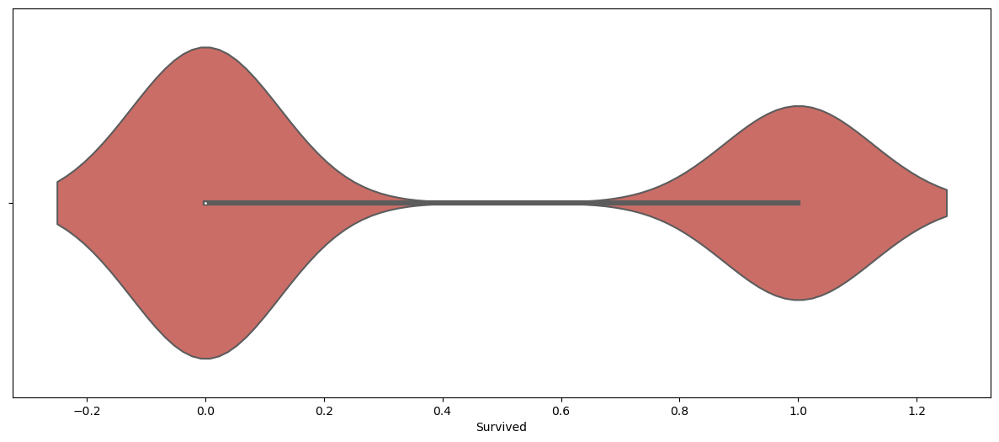

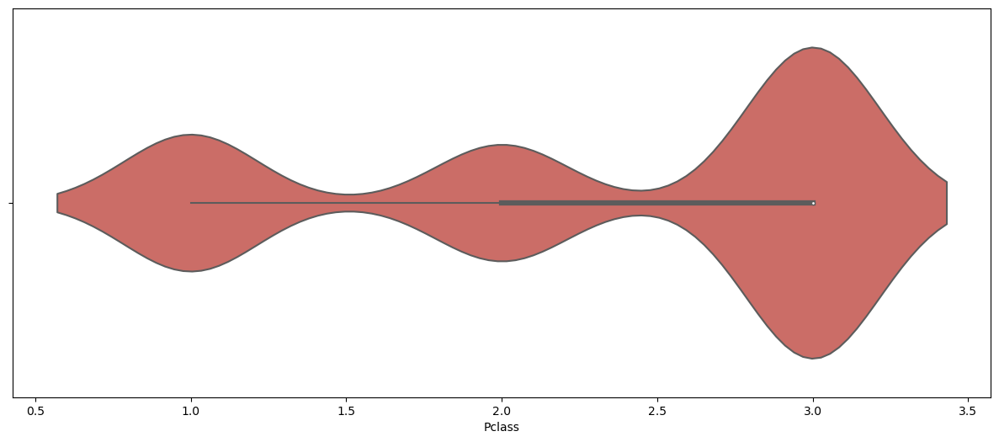

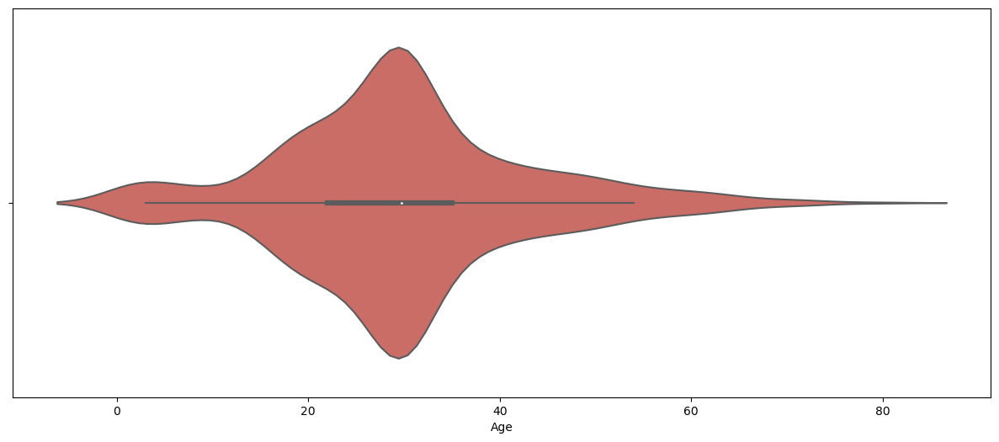

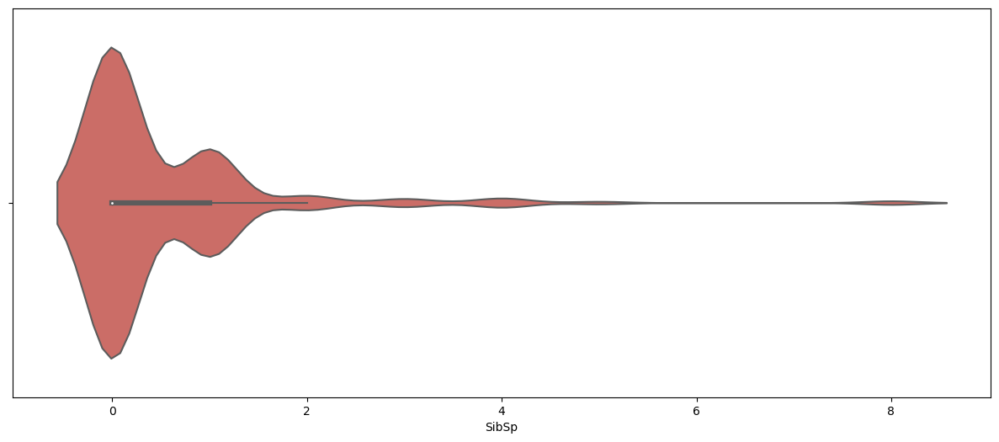

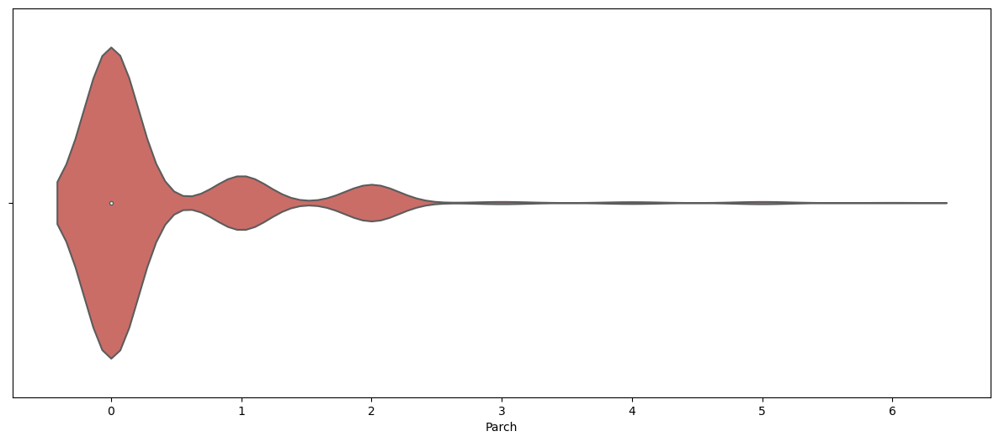

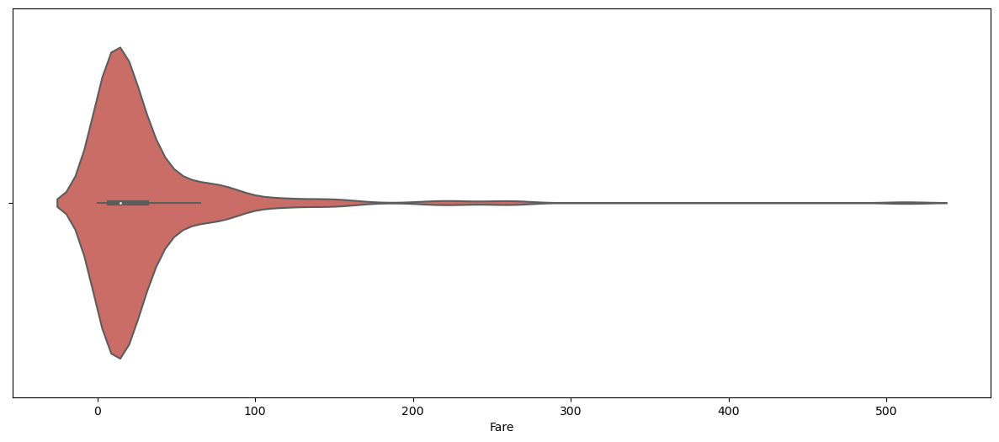

In [28]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.violinplot(x=i,data=df, palette='hls')#show density of data
    plt.xticks(rotation = 0)#white dot in it indicates median point.
    plt.show()

In [29]:
for i in numerical_columns:
    fig = go.Figure(data=[go.Histogram(x=df[i],nbinsx=20)])
    fig.update_layout(
    title=i,xaxis_title=i,yaxis_title="Count")
    fig.show()

In [30]:
for i in numerical_columns:
    fig = go.Figure(data=[go.Box(x=df[i])])
    fig.update_layout(
    title=i,xaxis_title=i,yaxis_title="Count")
    fig.show()

In [31]:
for i in numerical_columns:
    fig = go.Figure(data=[go.Violin(x=df[i])])
    fig.update_layout(
    title=i,xaxis_title=i,yaxis_title="Count")
    fig.show()

# Bivariate Analysis

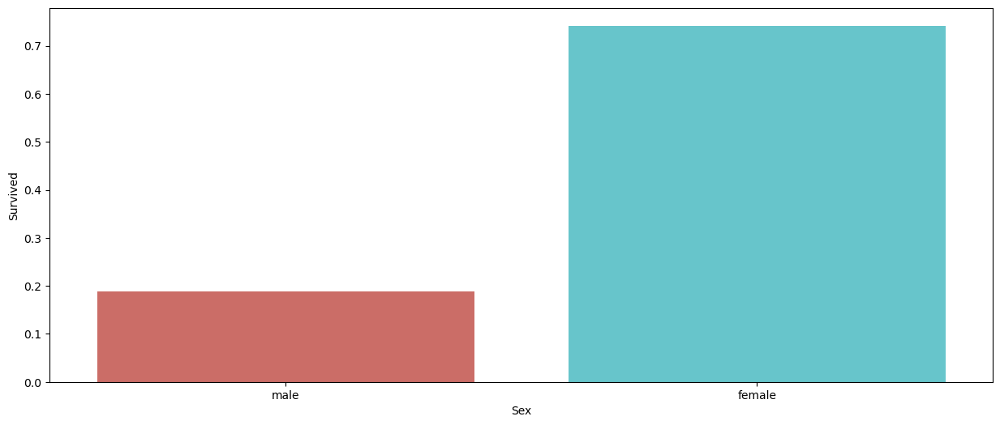

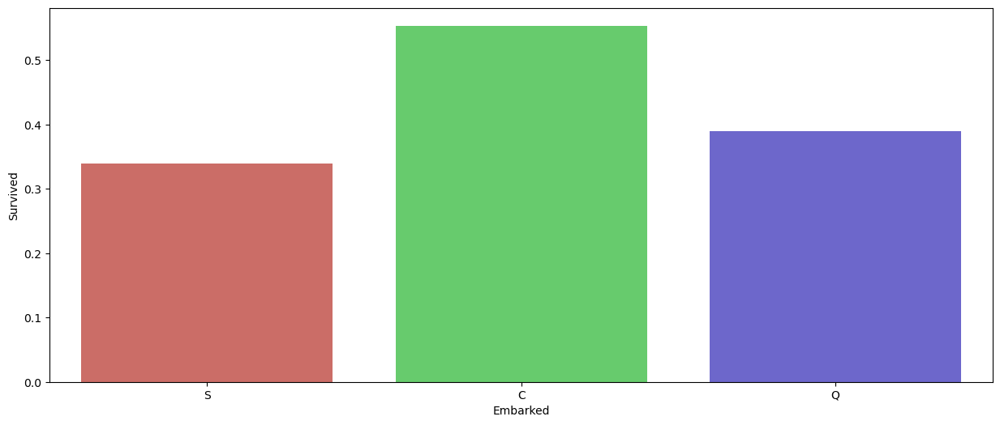

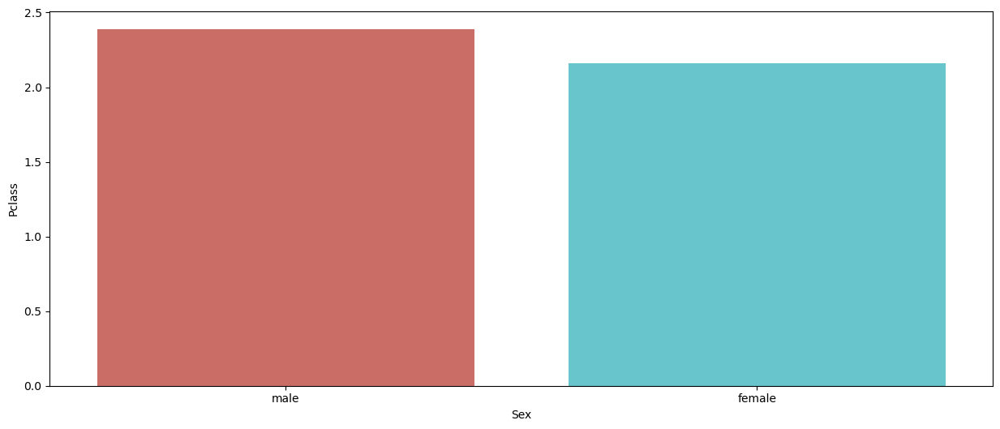

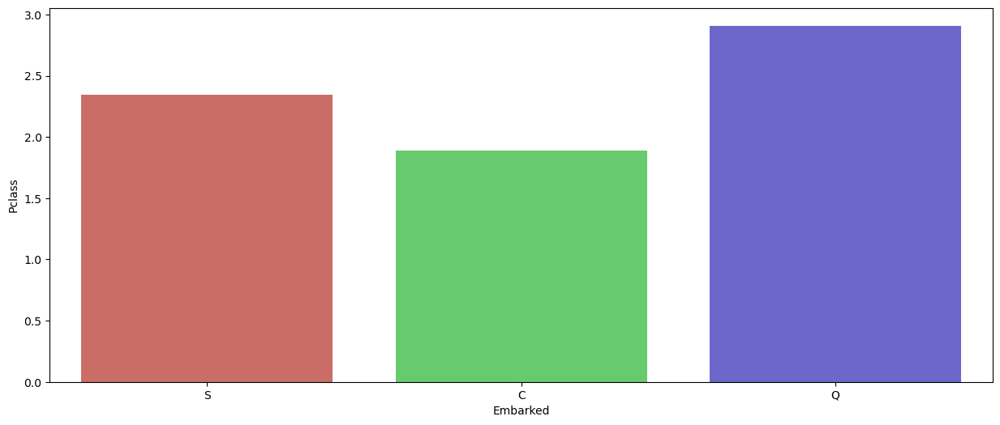

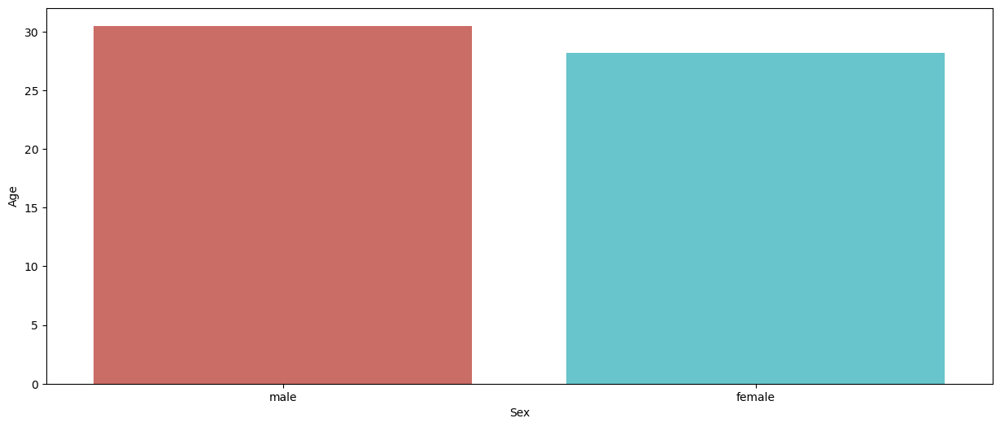

...

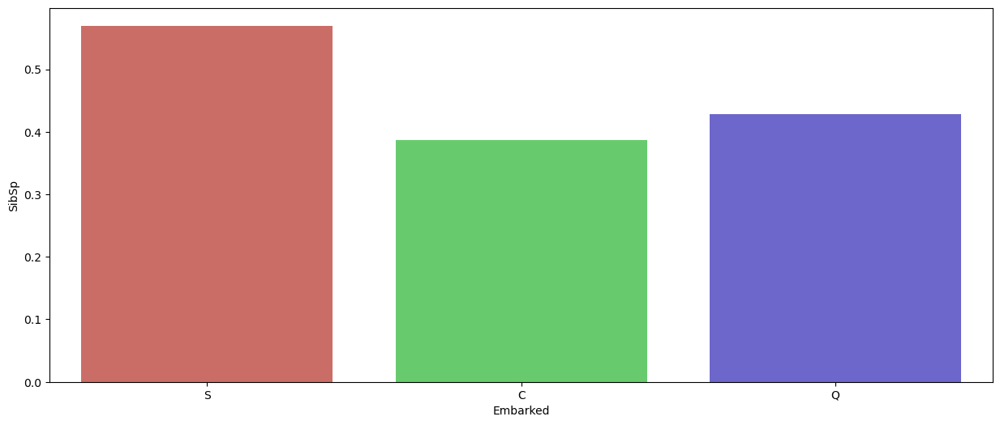

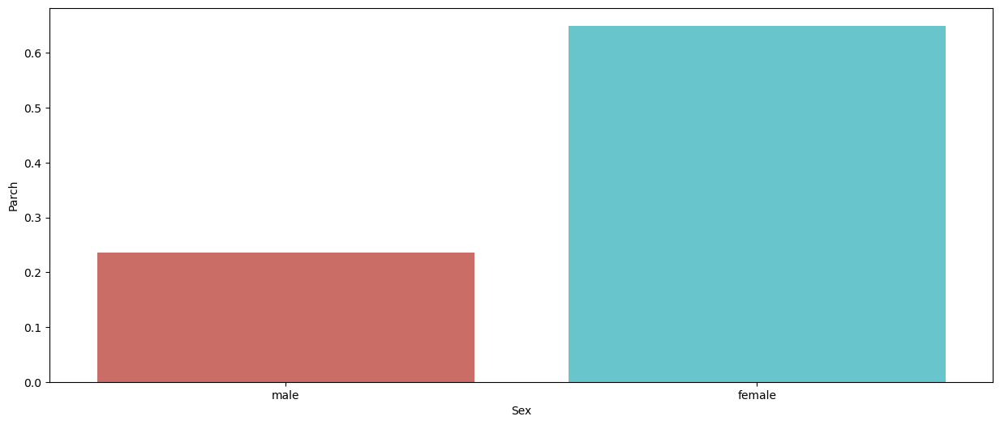

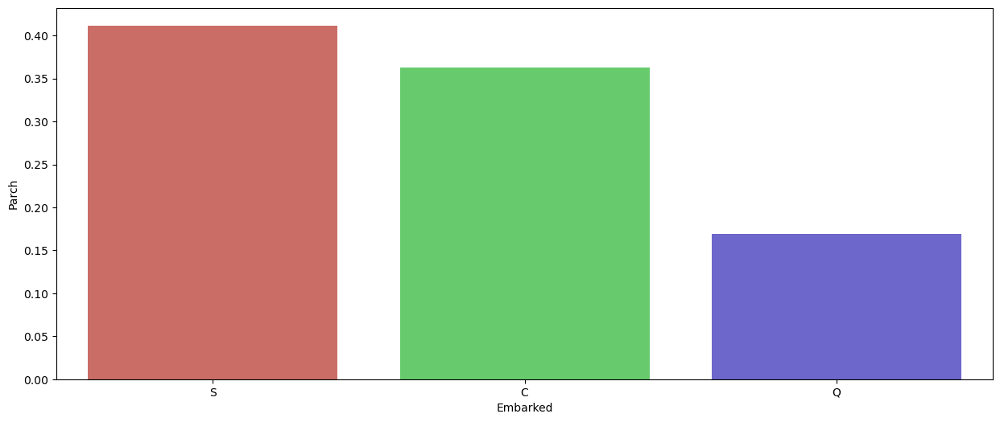

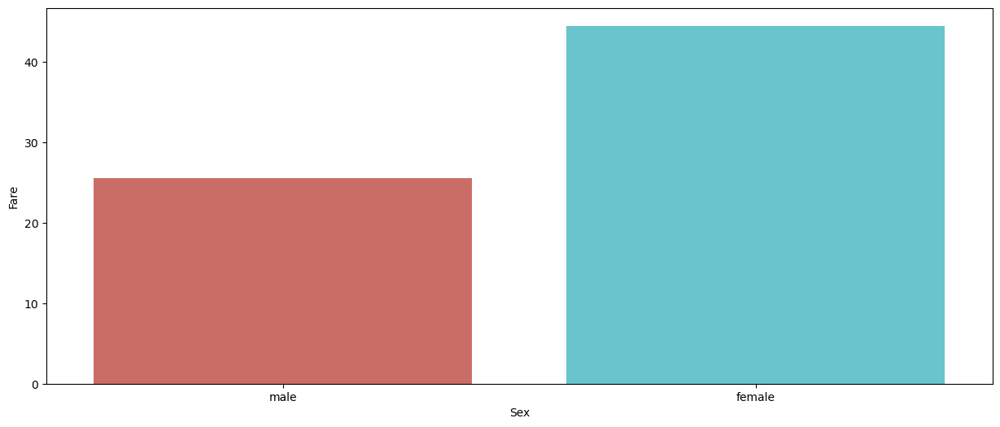

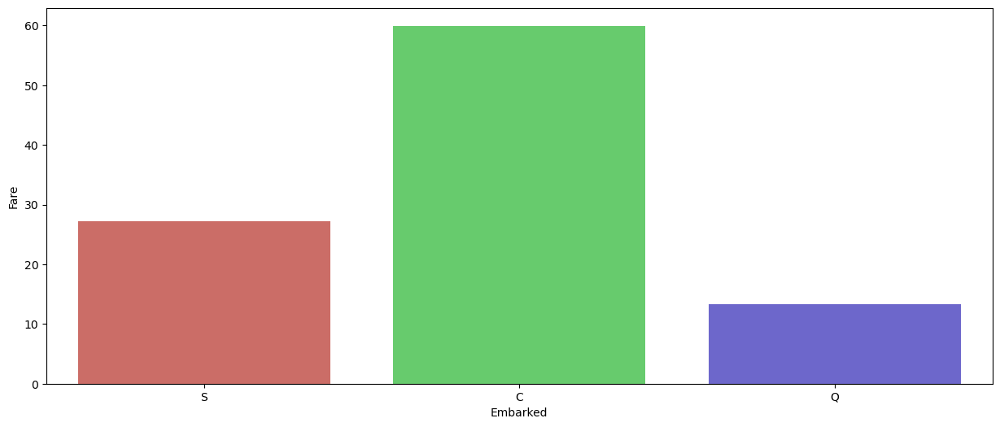

In [32]:
for i in numerical_columns:
    for j in object_columns:
        plt.figure(figsize=(15,6))
        sns.barplot(x= df[j],y =df[i], data = df, ci=None, palette='hls')#ci means confidence interval,if ci=false it displays error bars
        plt.show()

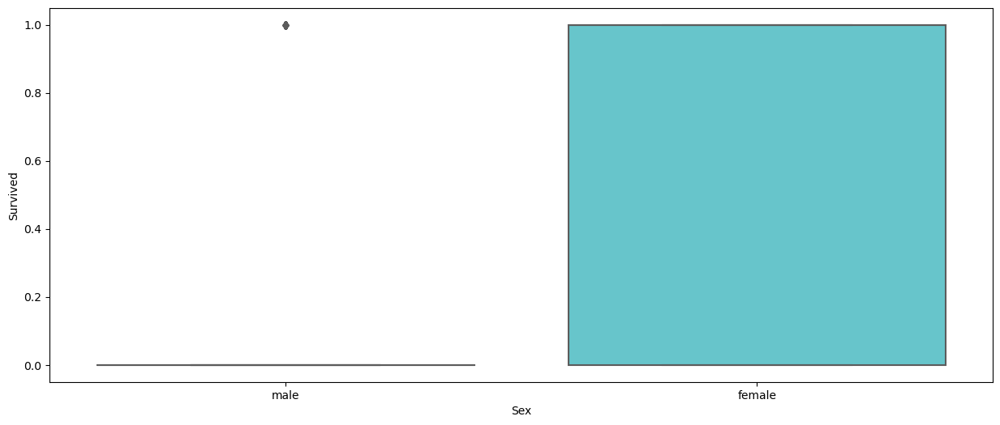

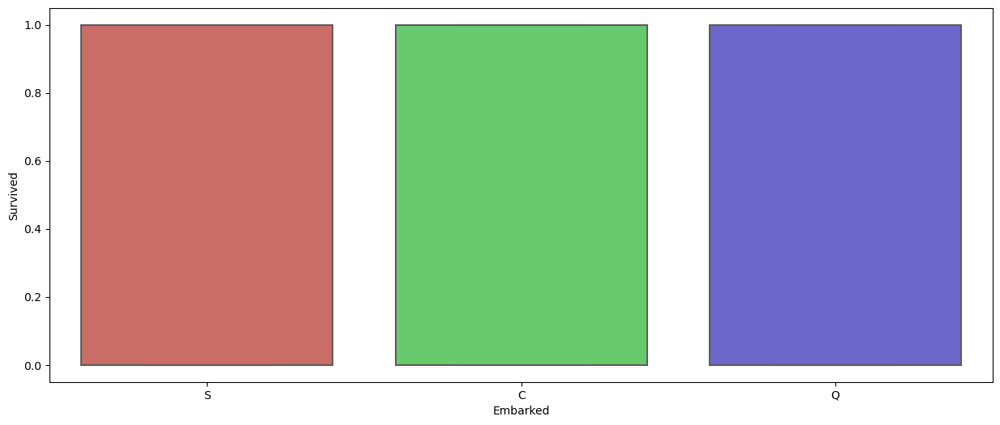

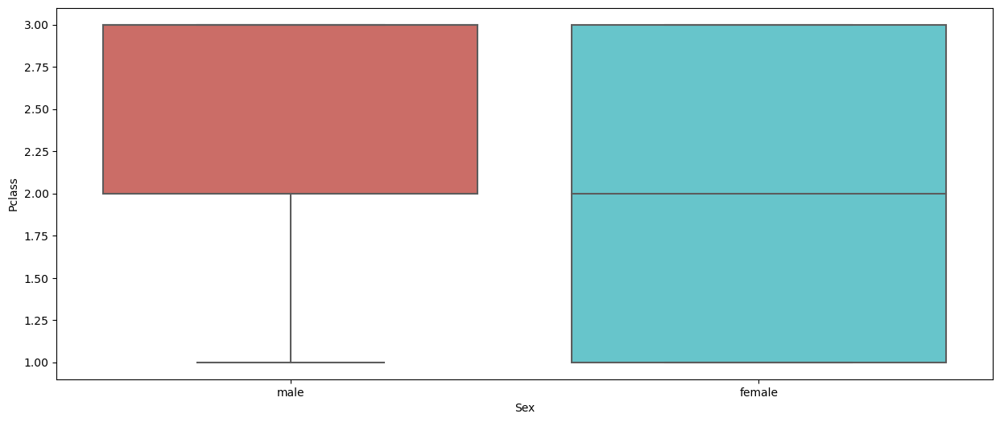

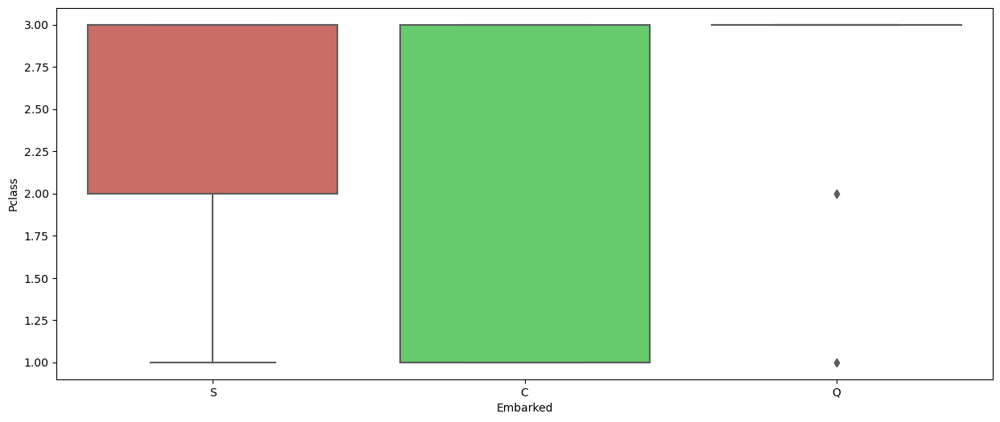

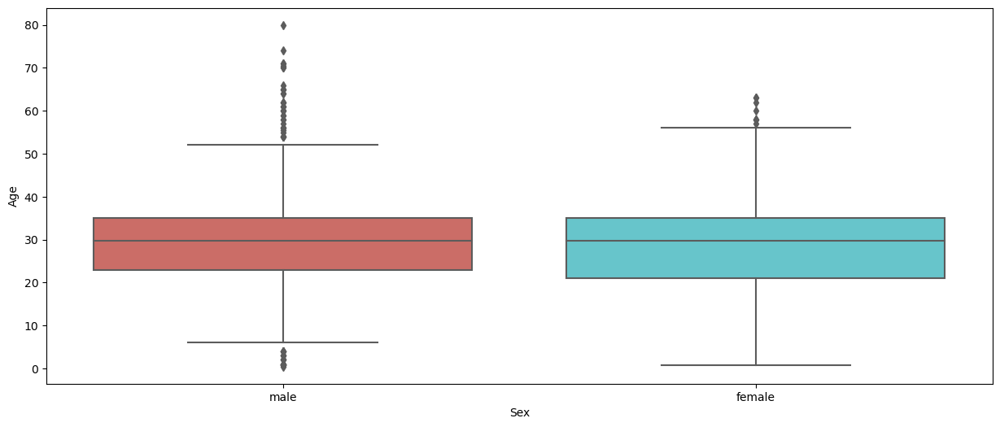

...

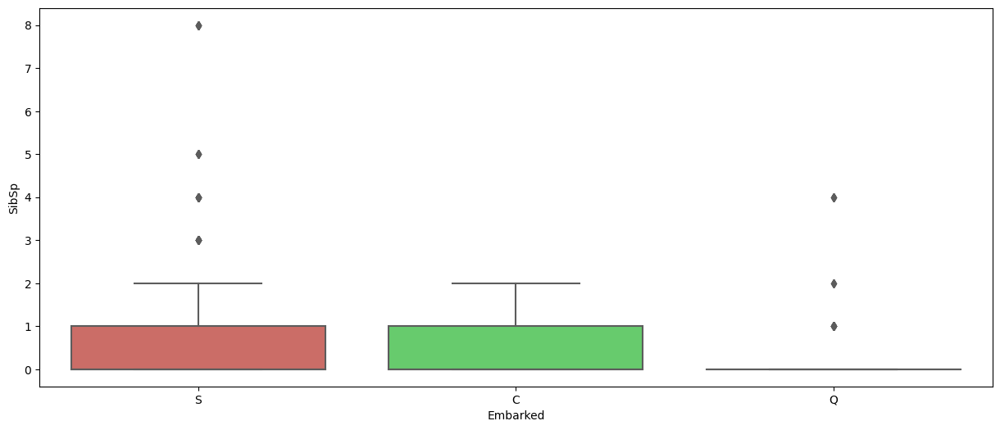

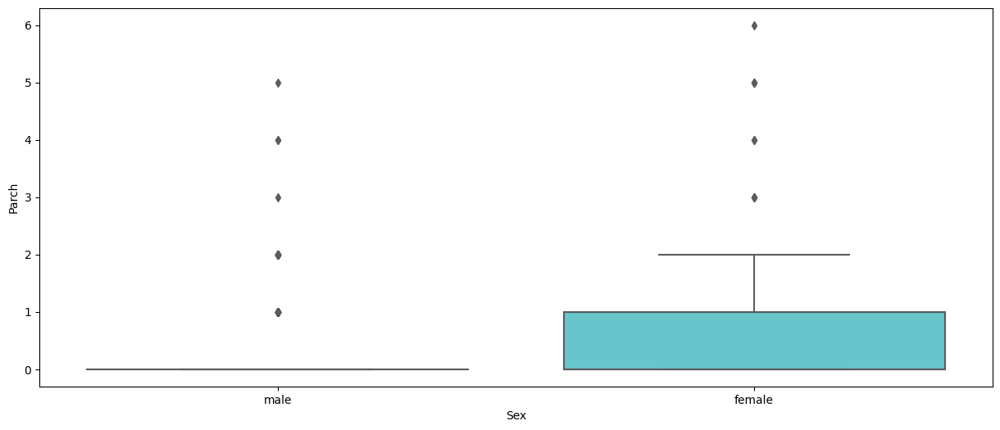

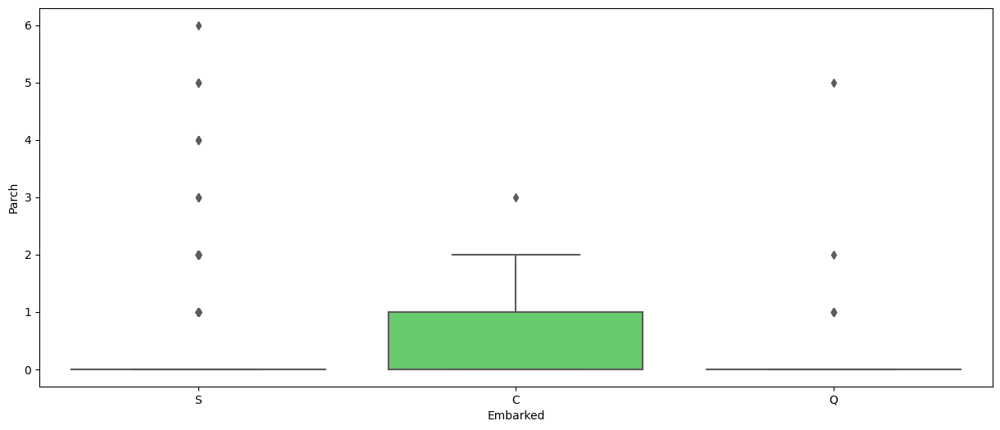

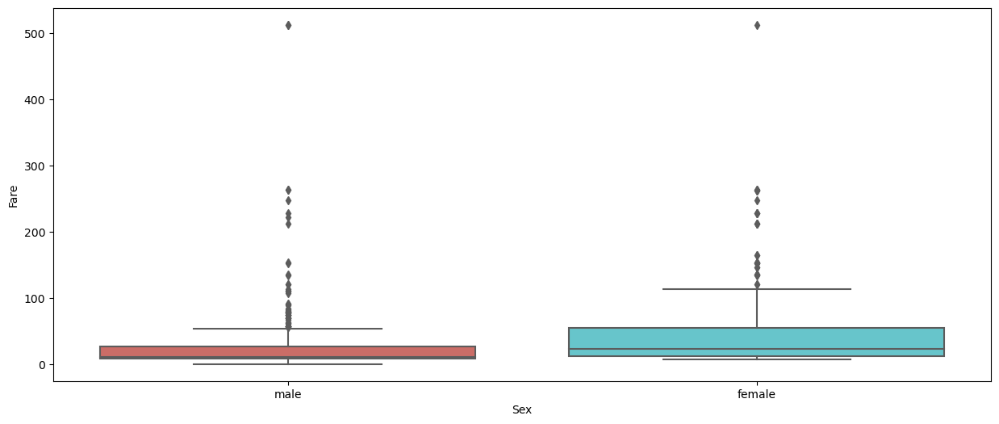

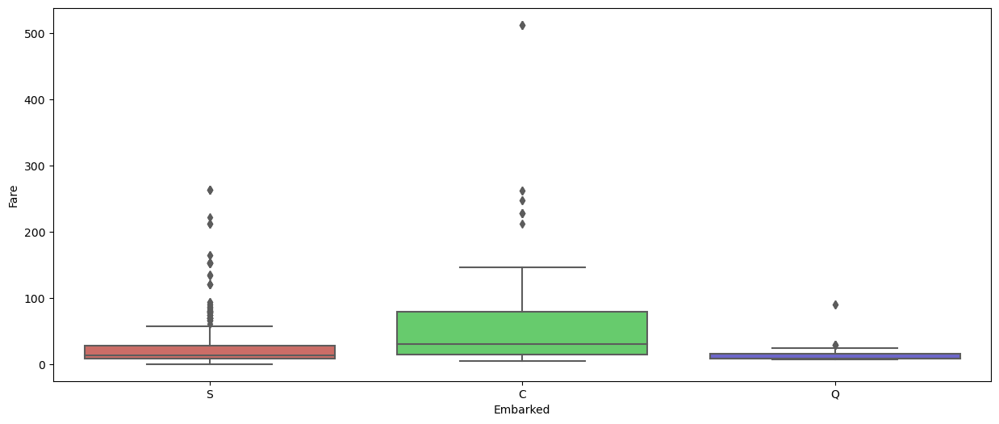

In [33]:
for i in numerical_columns:
    for j in object_columns:
        plt.figure(figsize=(15,6))
        sns.boxplot(x= df[j],y =df[i], data = df,palette='hls')
        plt.show()

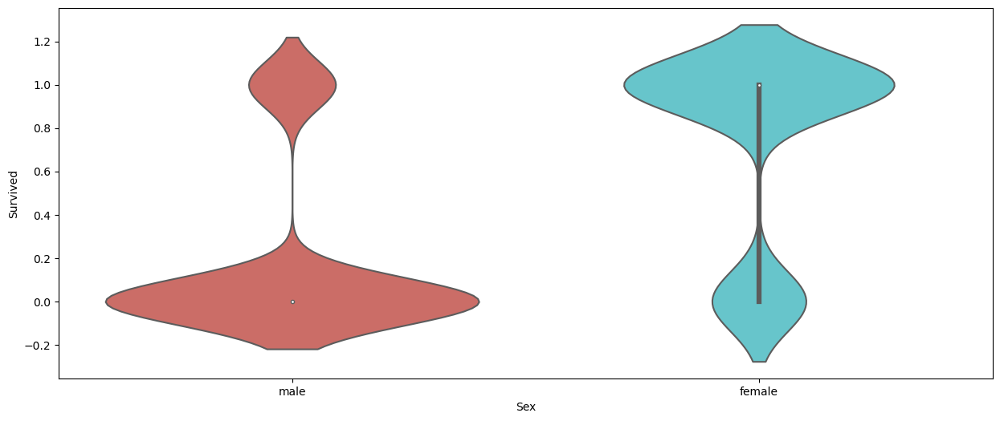

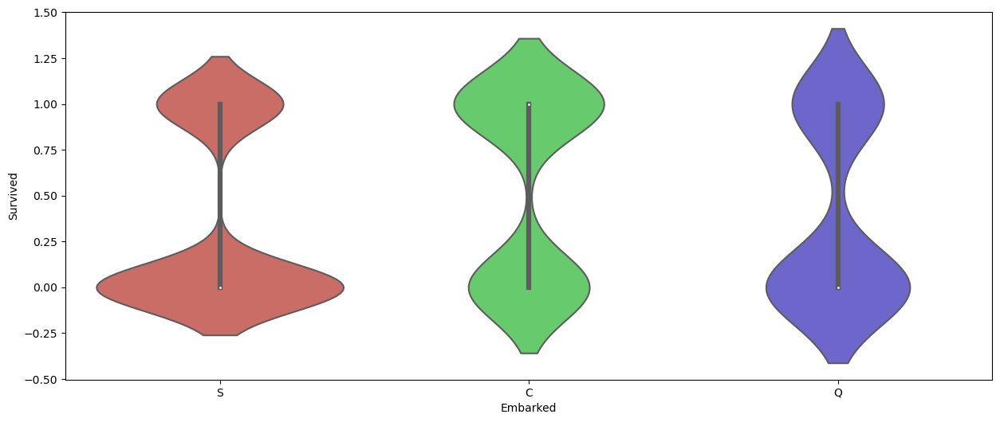

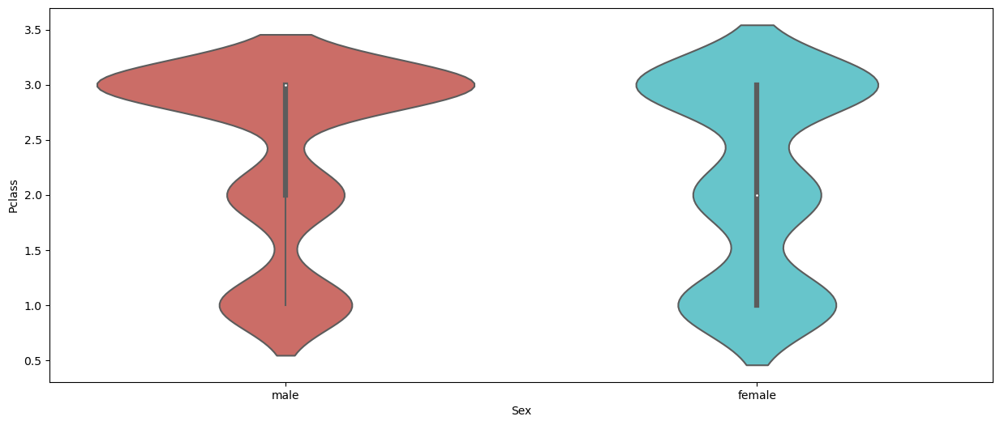

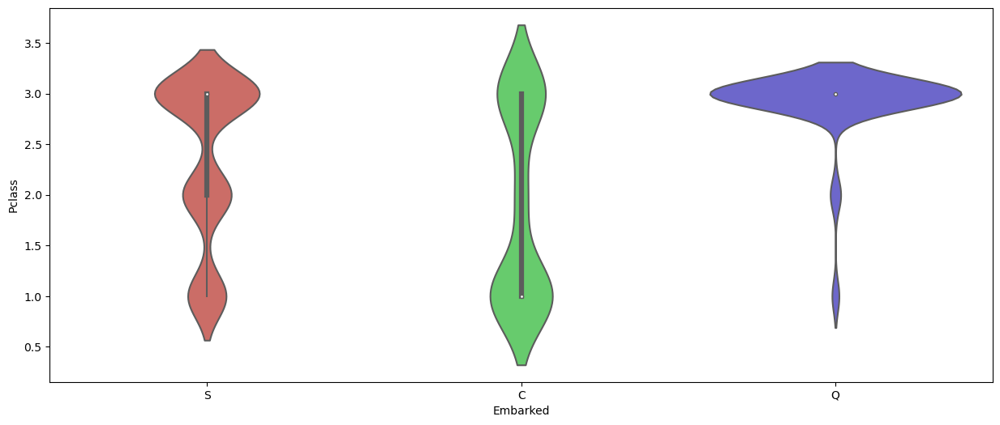

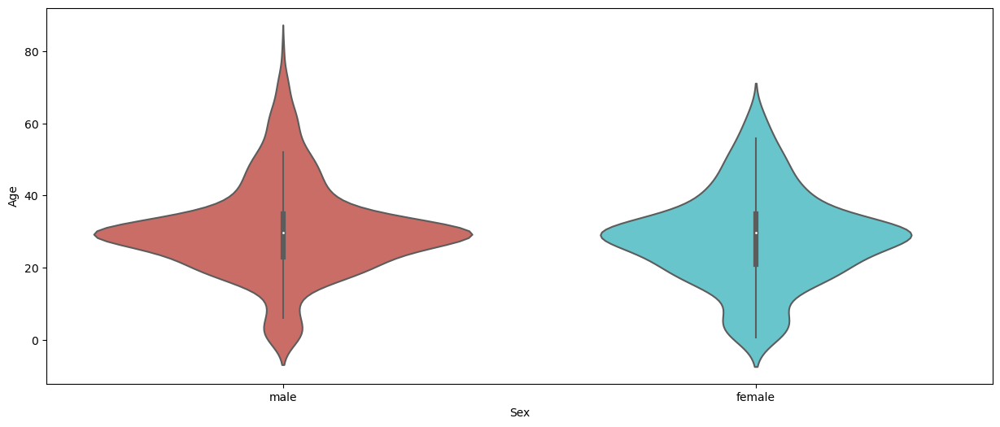

...

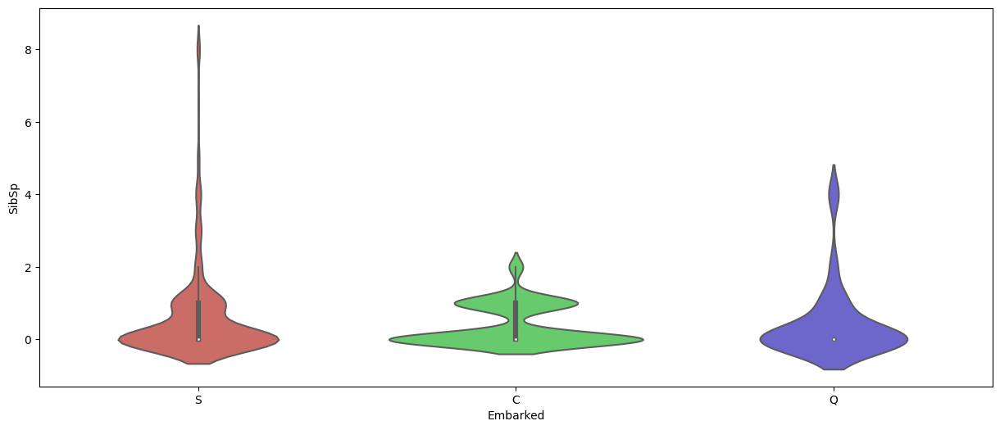

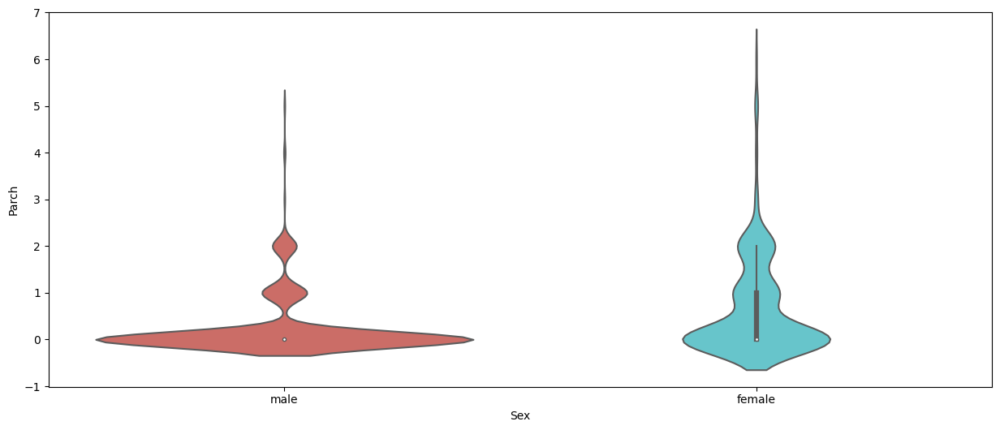

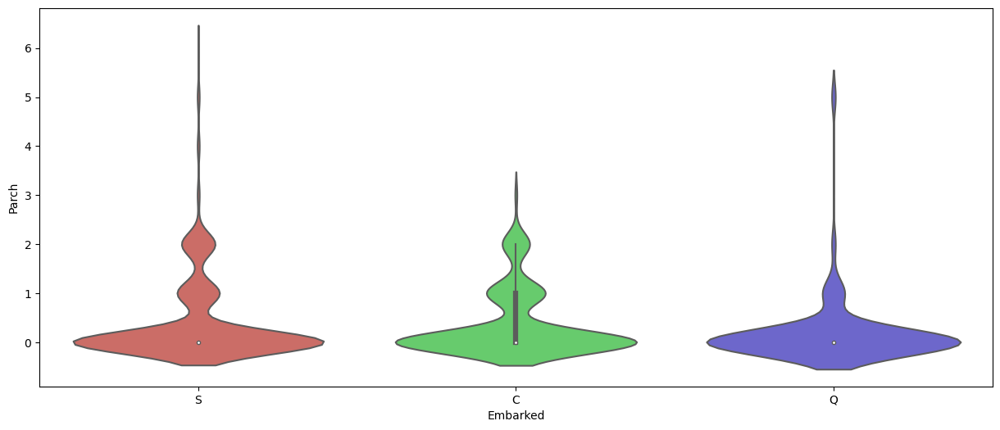

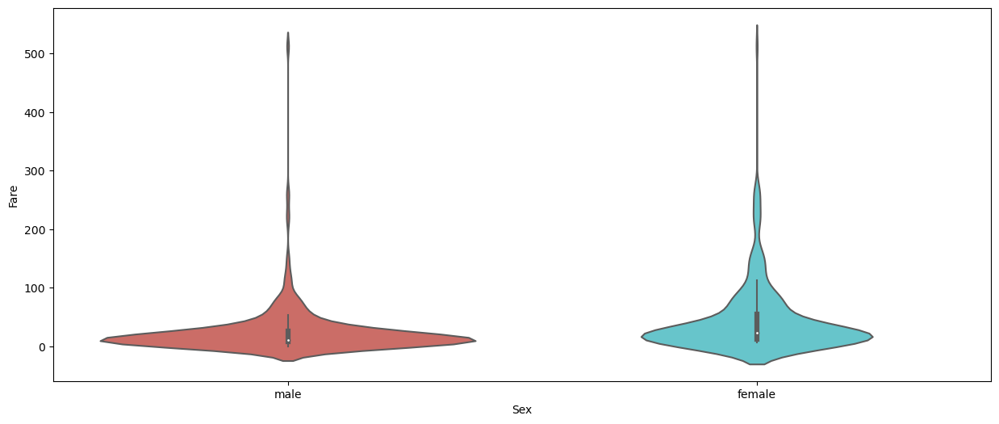

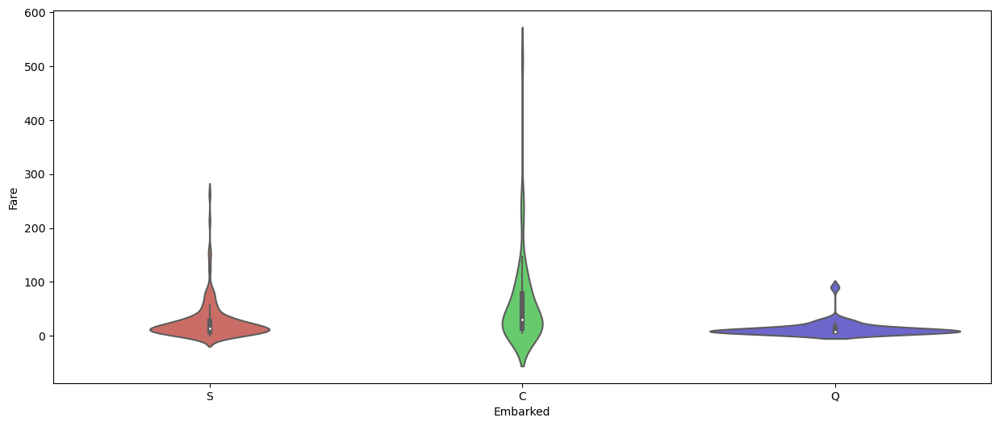

In [34]:
for i in numerical_columns:
    for j in object_columns:
        plt.figure(figsize=(15,6))
        sns.violinplot(x= df[j],y =df[i], data = df, ci=None, palette='hls')
        plt.show()

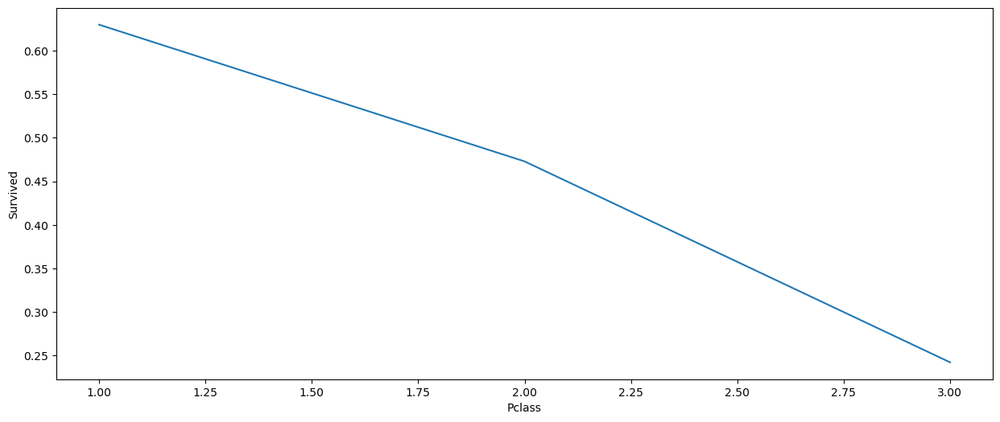

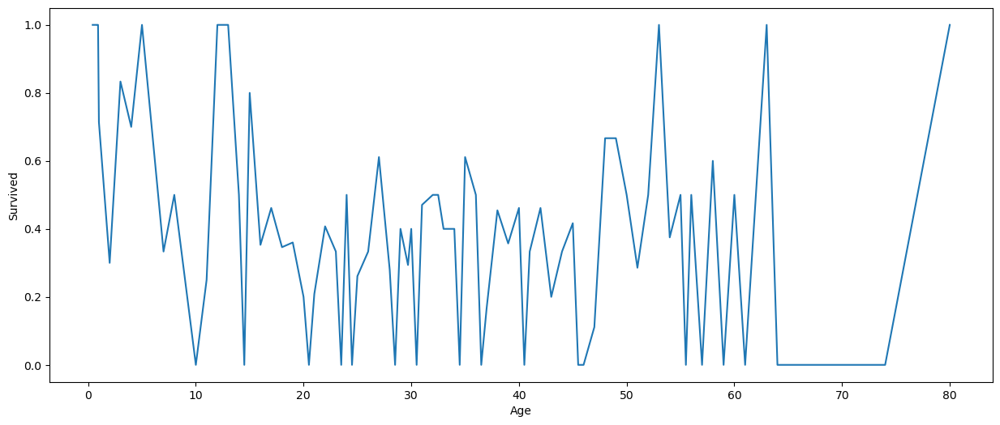

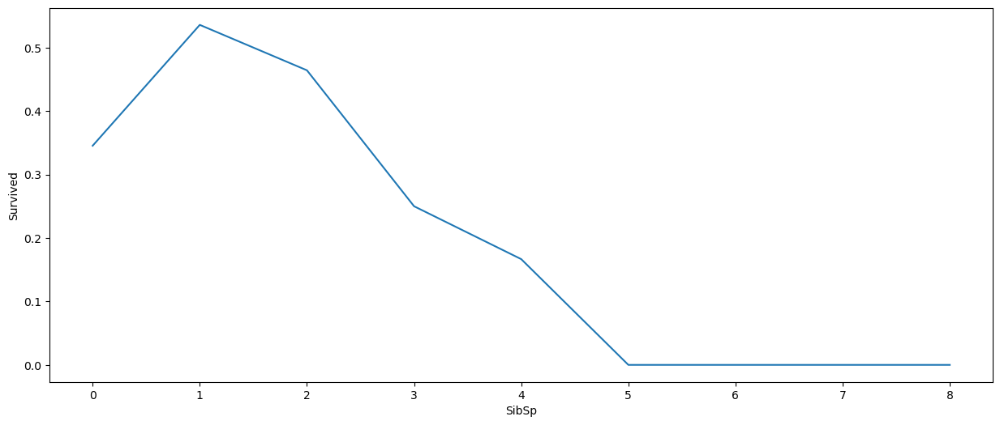

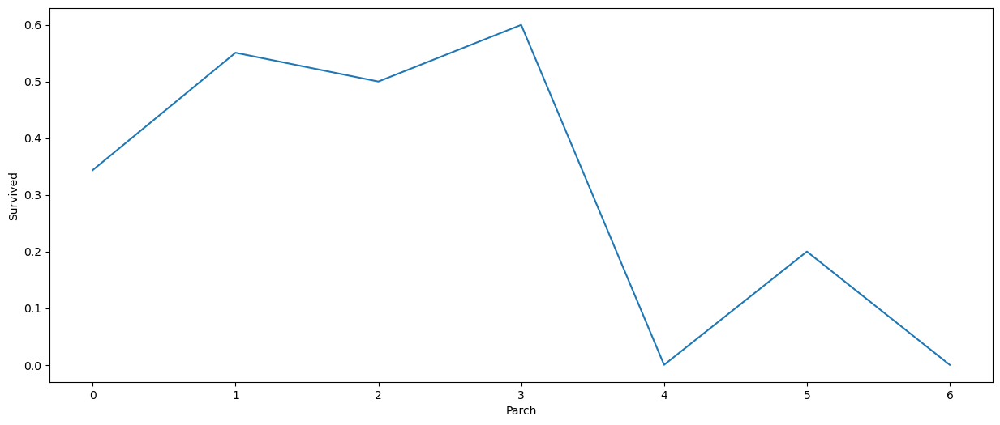

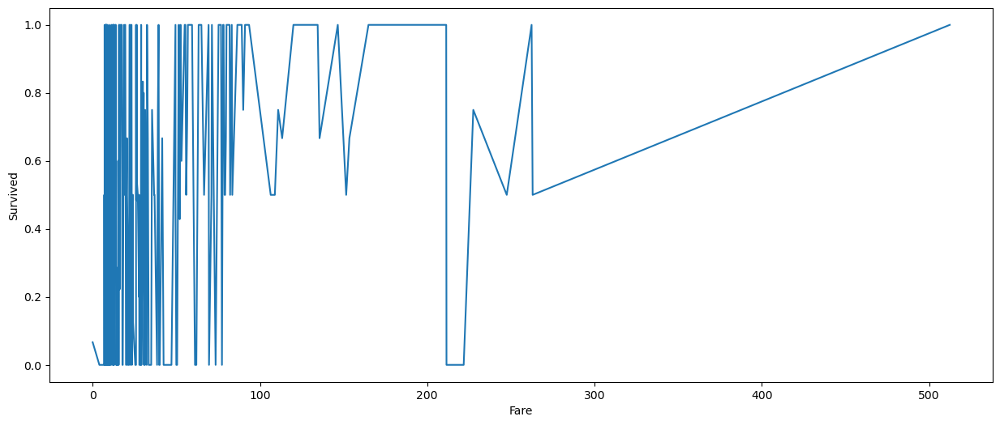

...

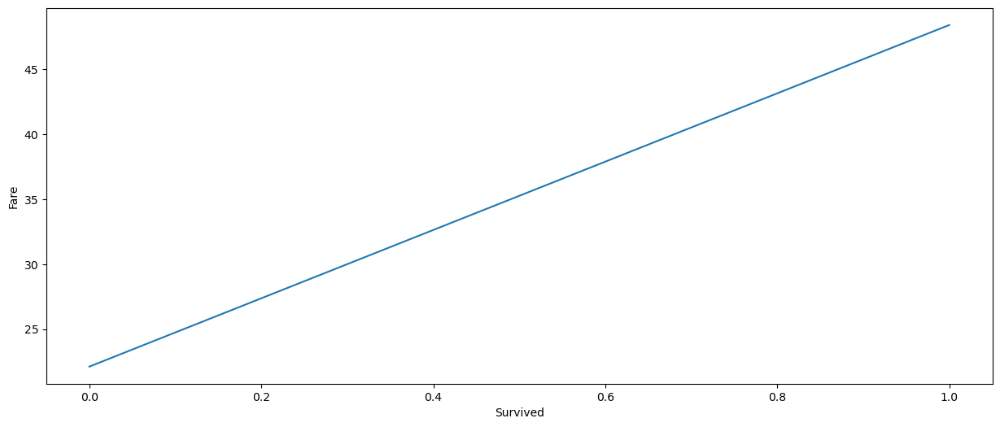

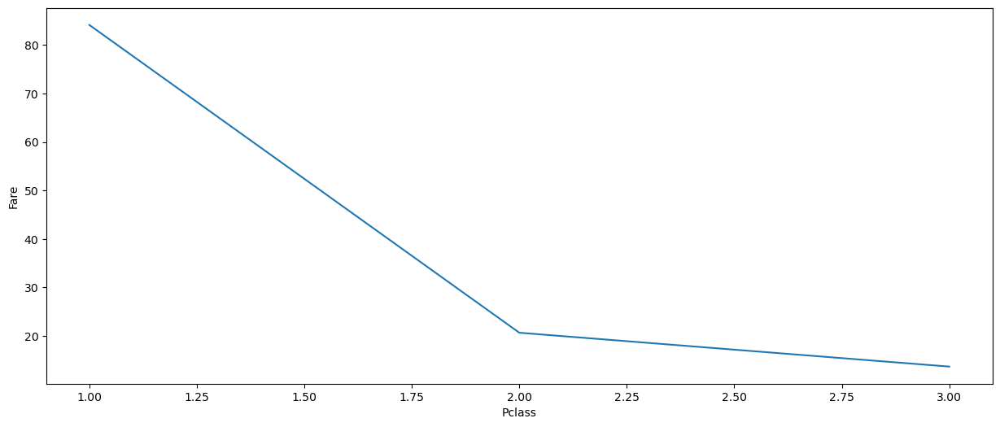

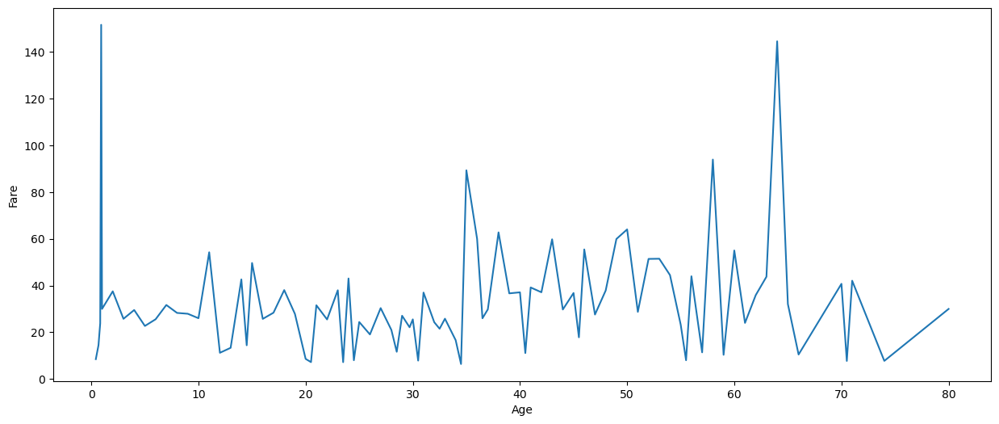

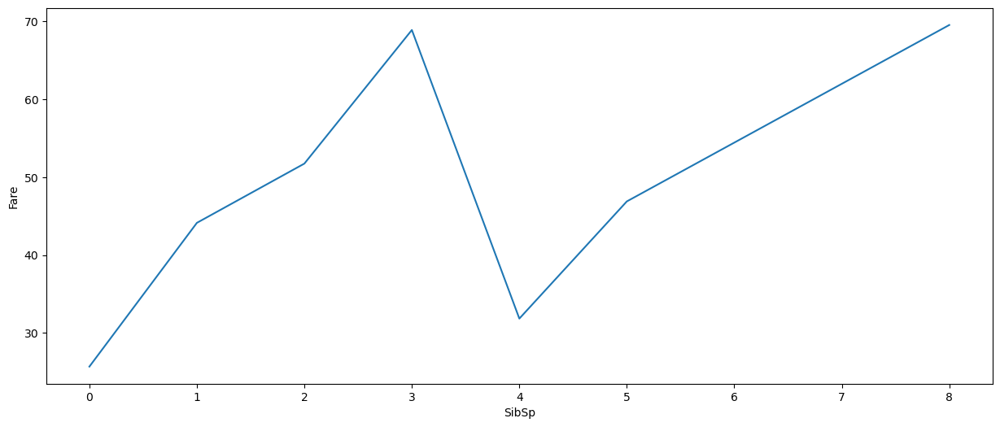

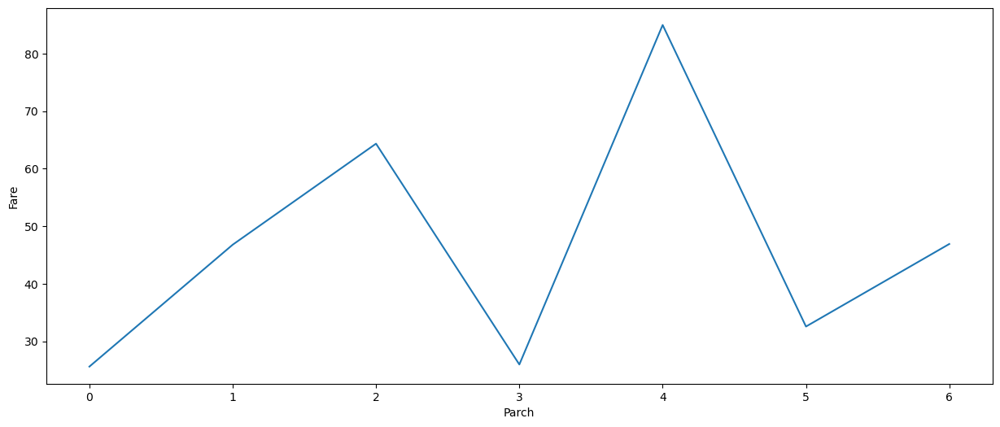

In [35]:
for i in numerical_columns:
    for j in numerical_columns:
        if i != j:
            plt.figure(figsize=(15,6))
            sns.lineplot(x = df[j], y = df[i], data = df,ci= None, palette= 'hls')  
            plt.show()

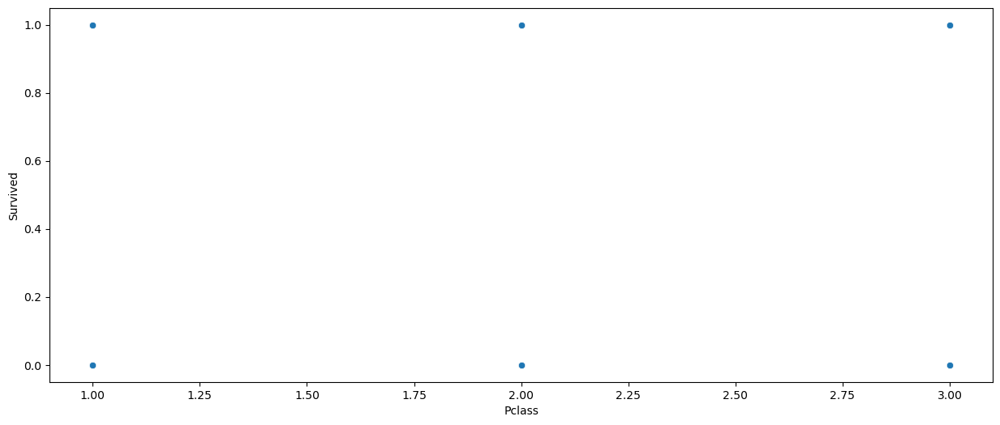

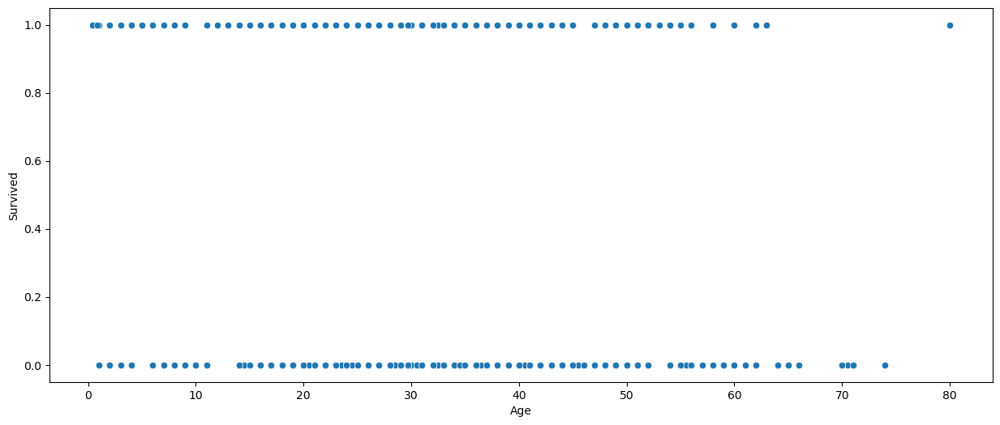

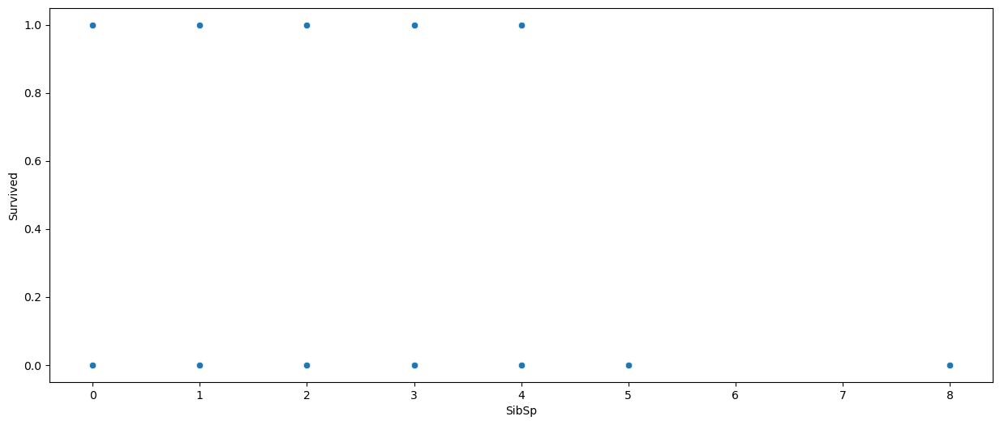

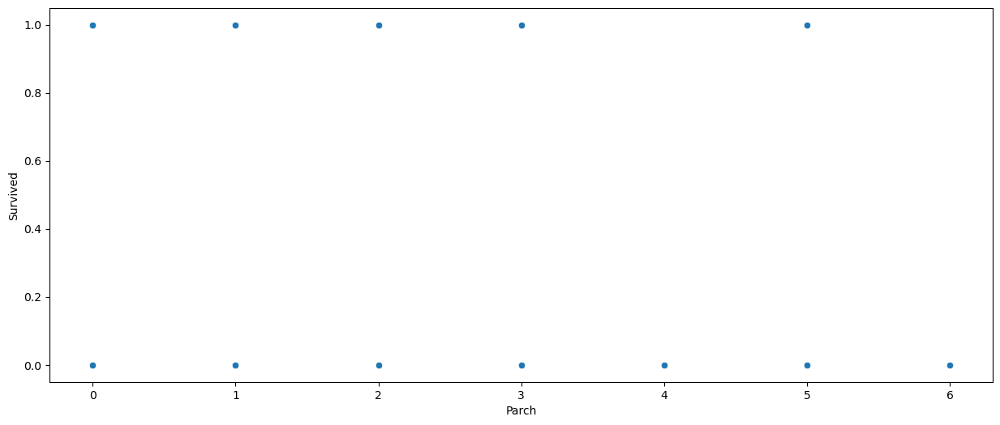

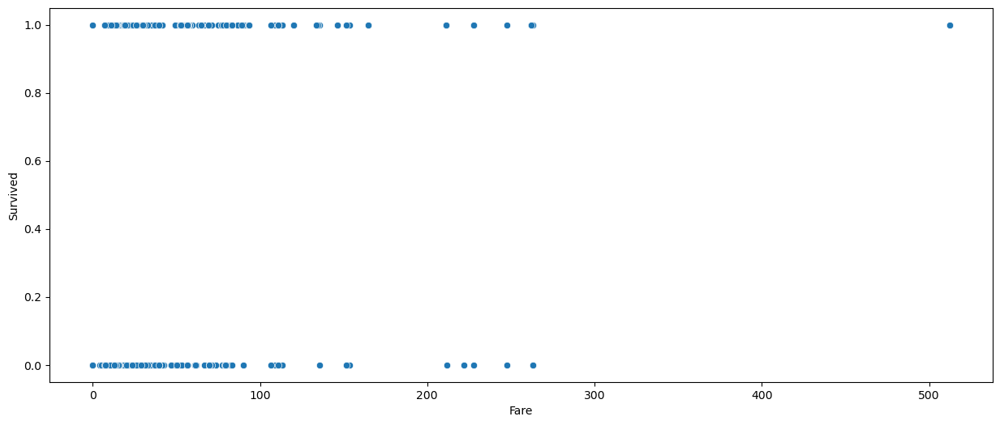

...

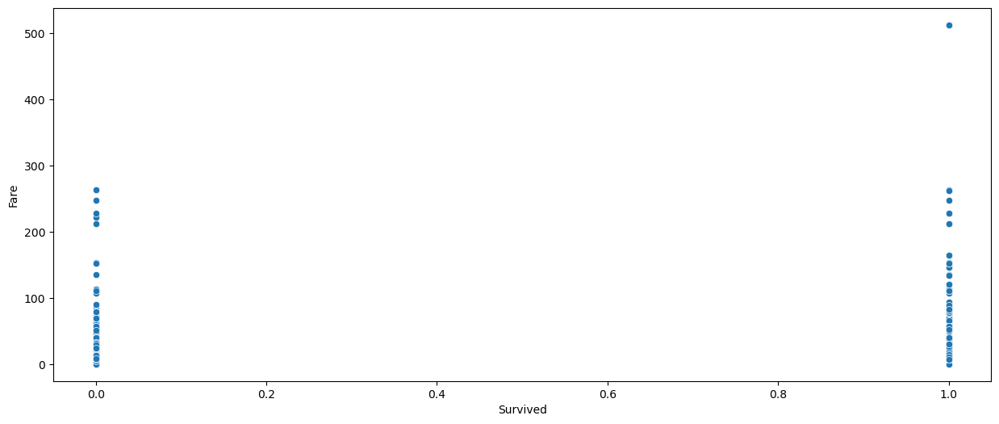

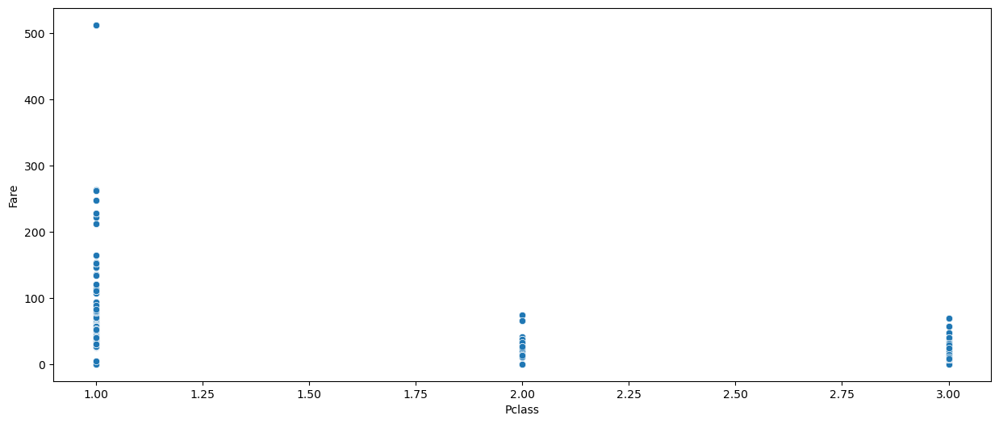

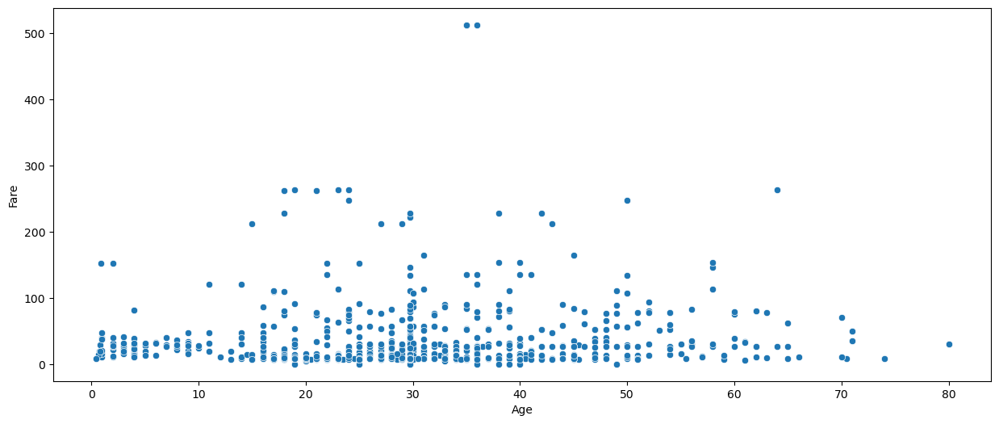

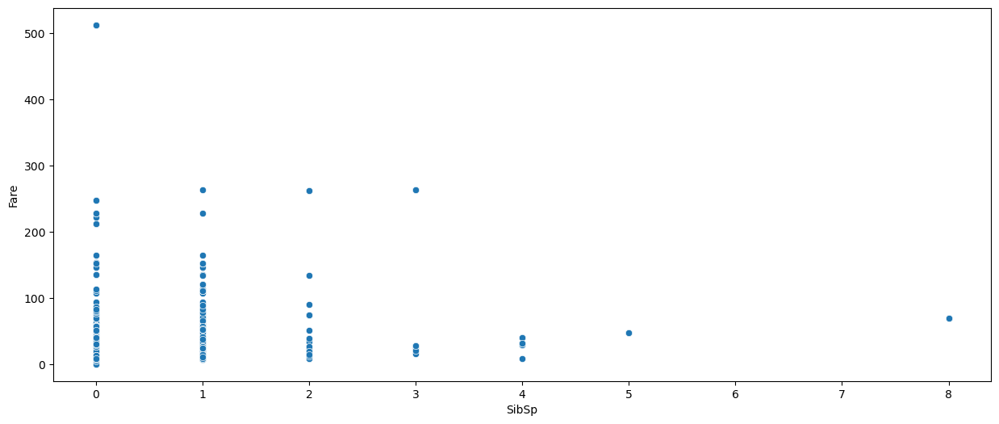

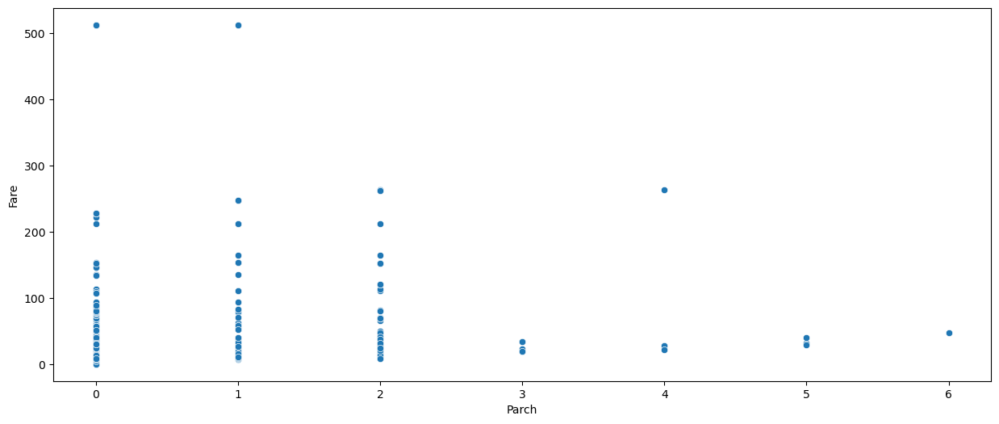

In [37]:
for i in numerical_columns:
    for j in numerical_columns:
        if i != j:
            plt.figure(figsize=(15,6))
            sns.scatterplot(x = df[j], y = df[i],data=df, palette= 'hls')  
            plt.show()

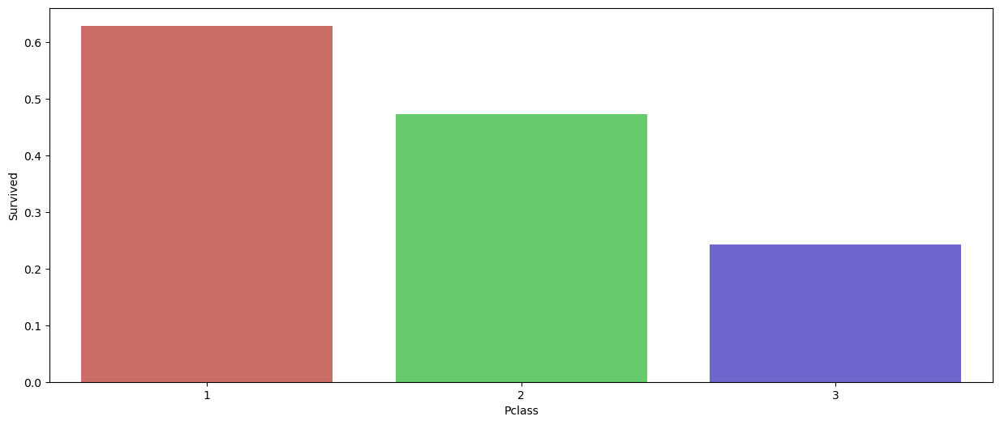

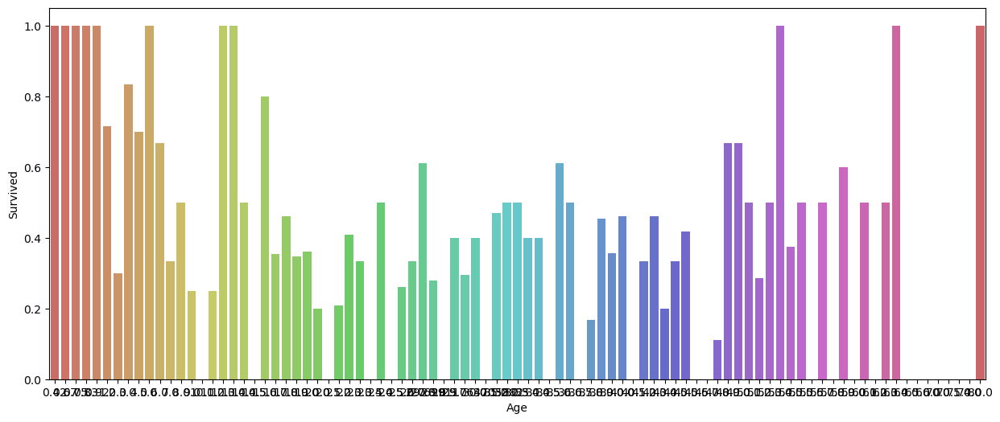

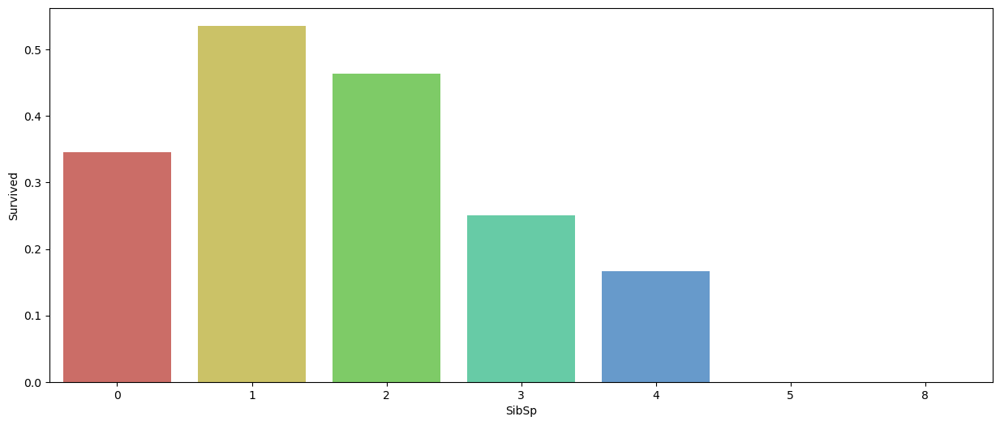

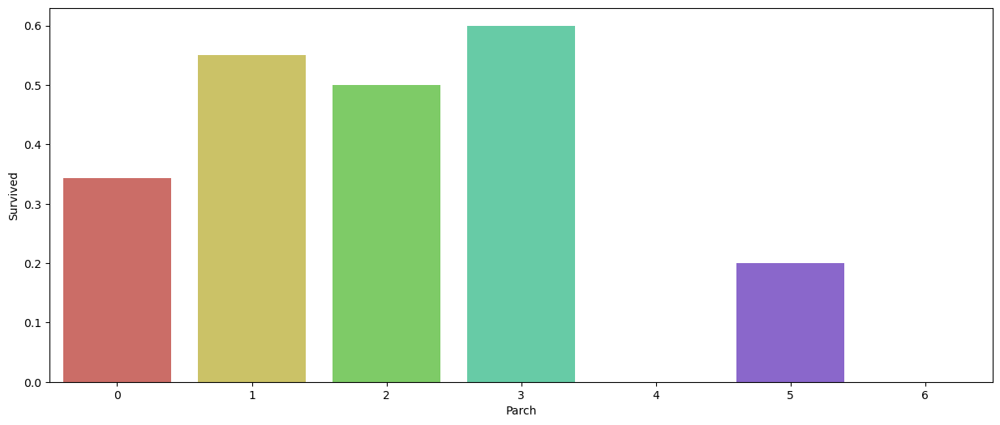

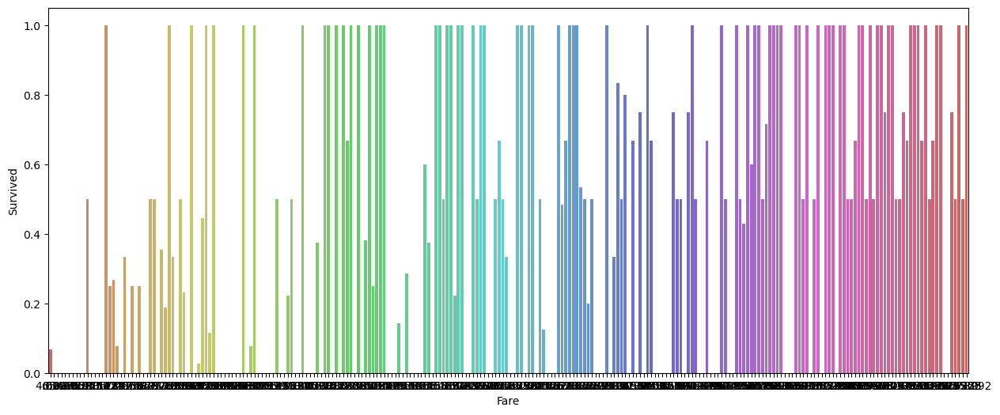

...

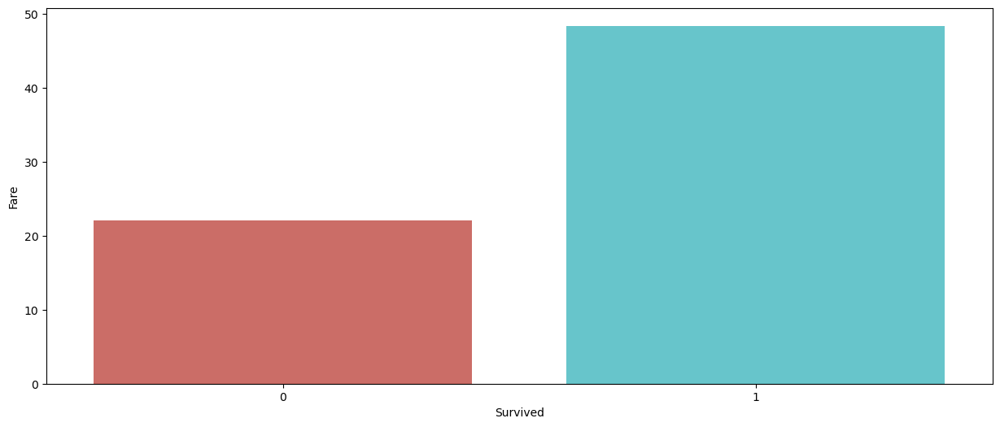

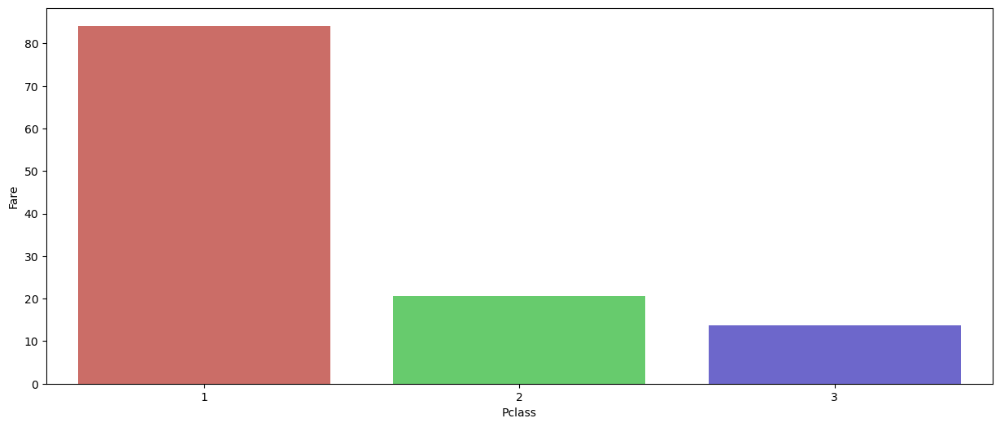

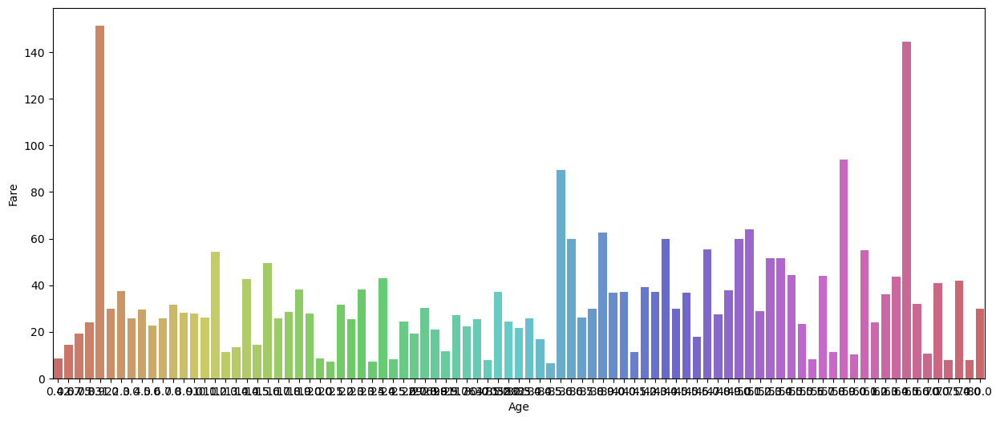

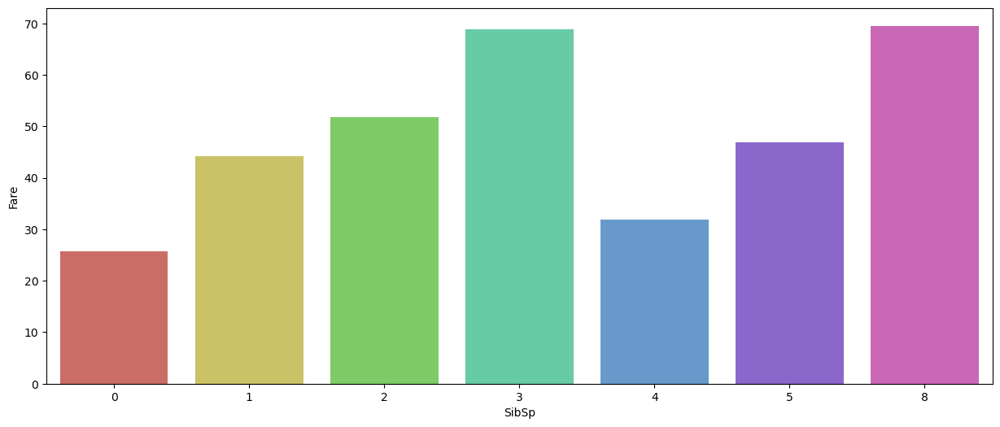

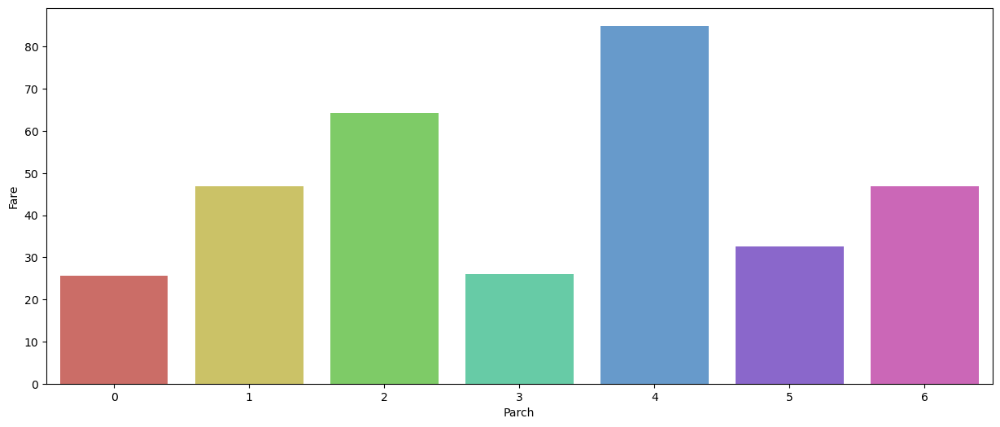

In [36]:
for i in numerical_columns:
    for j in numerical_columns:
        if i != j:
            plt.figure(figsize=(15,6))
            sns.barplot(x = df[j], y = df[i], data = df,ci= None, palette= 'hls')  
            plt.show()

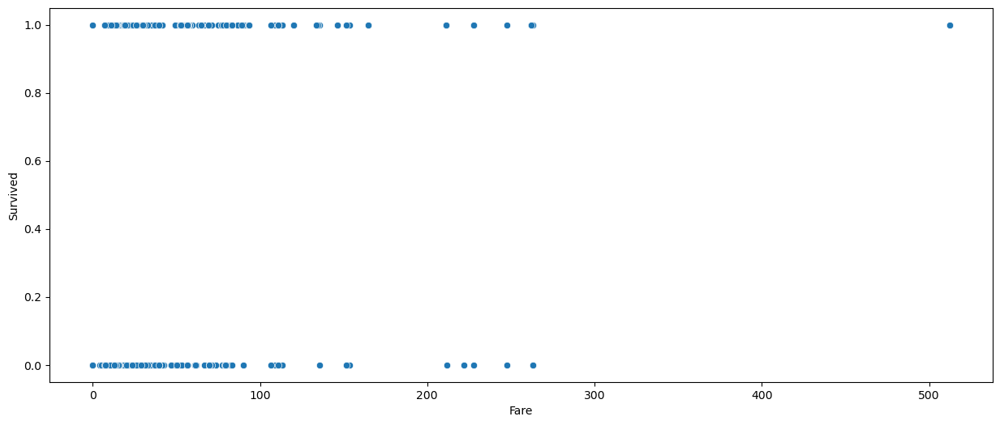

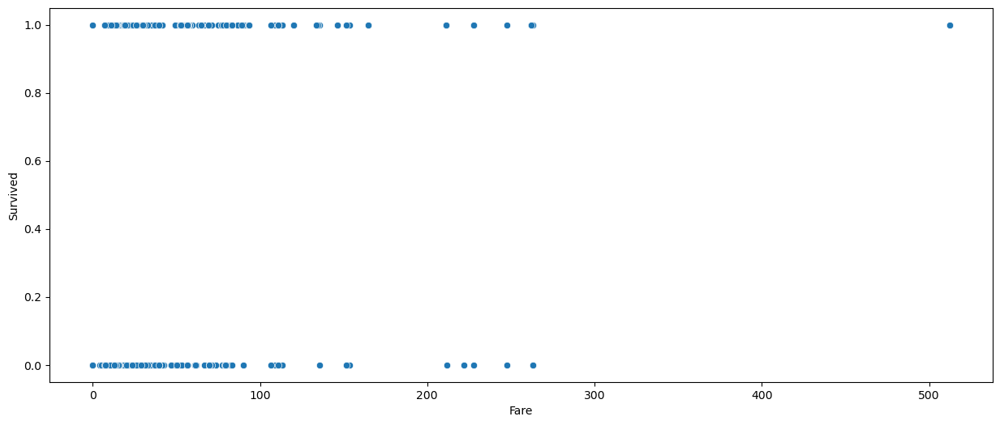

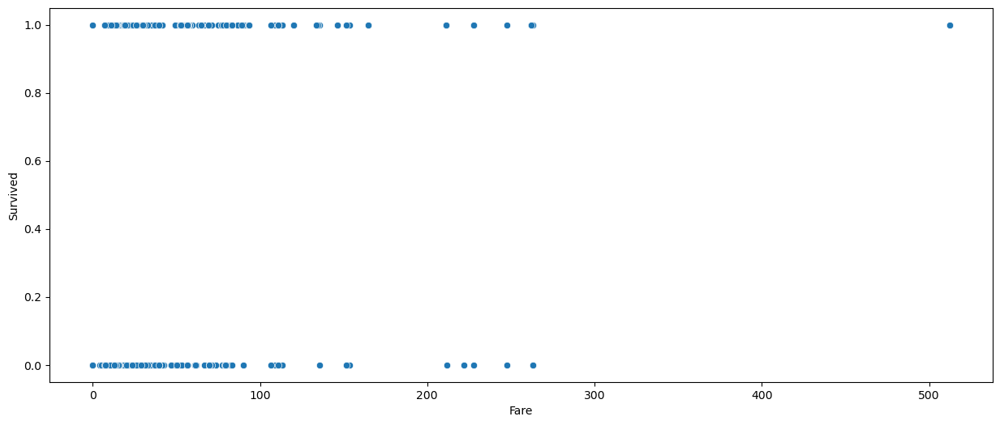

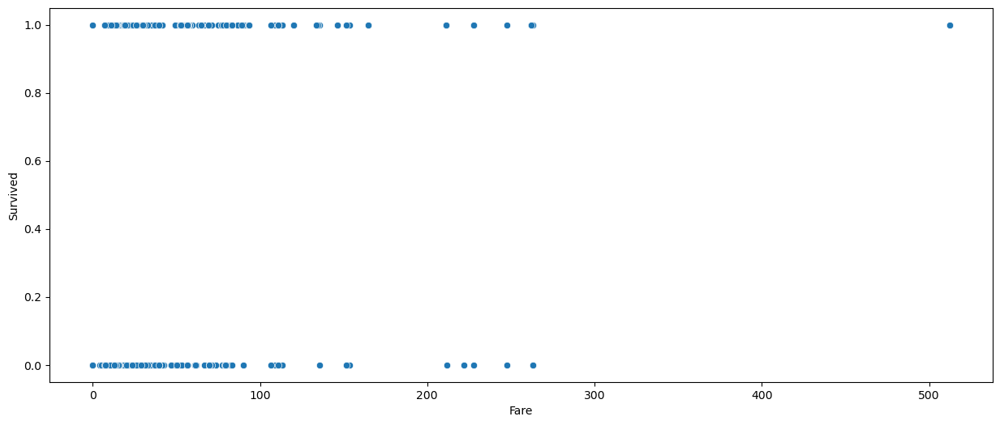

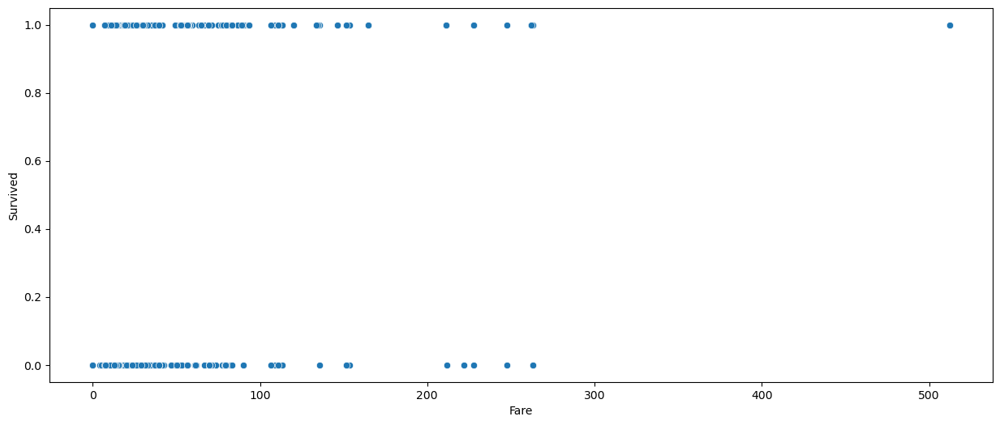

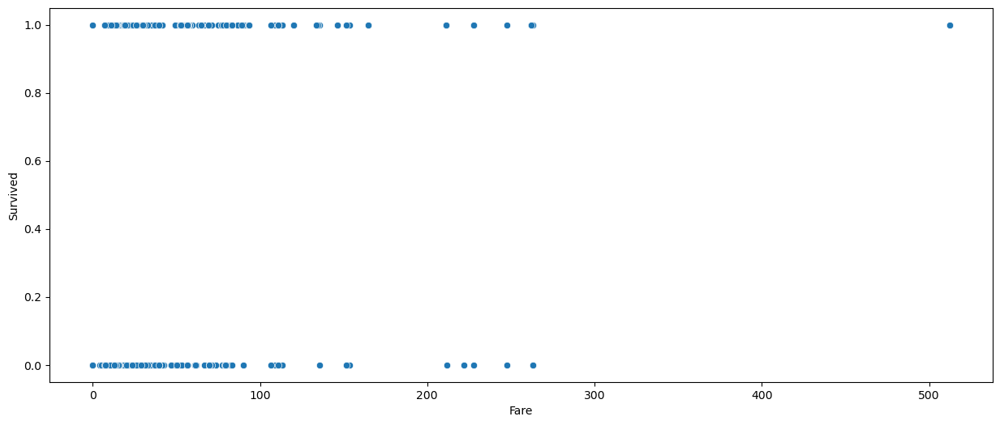

In [38]:
for i in numerical_columns:
    plt.figure(figsize=(15,6))
    sns.scatterplot(x = df[j], y = df['Survived'], data = df, palette= 'hls')  
    plt.show()

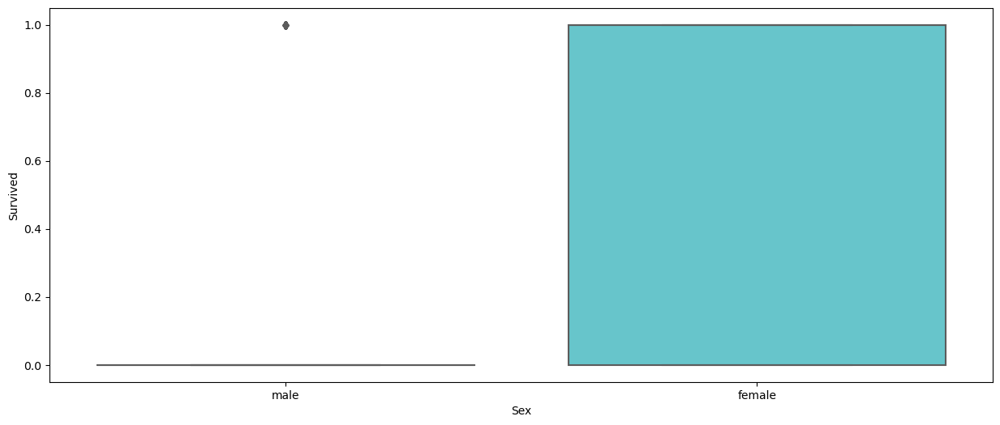

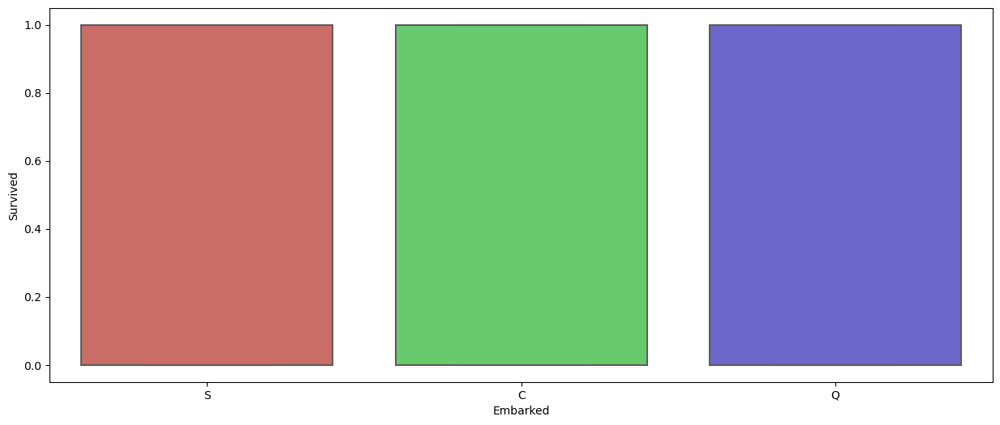

In [39]:
for j in object_columns:
    plt.figure(figsize=(15,6))
    sns.boxplot(x = df[j], y = df['Survived'], data = df, palette= 'hls')  
    plt.show()

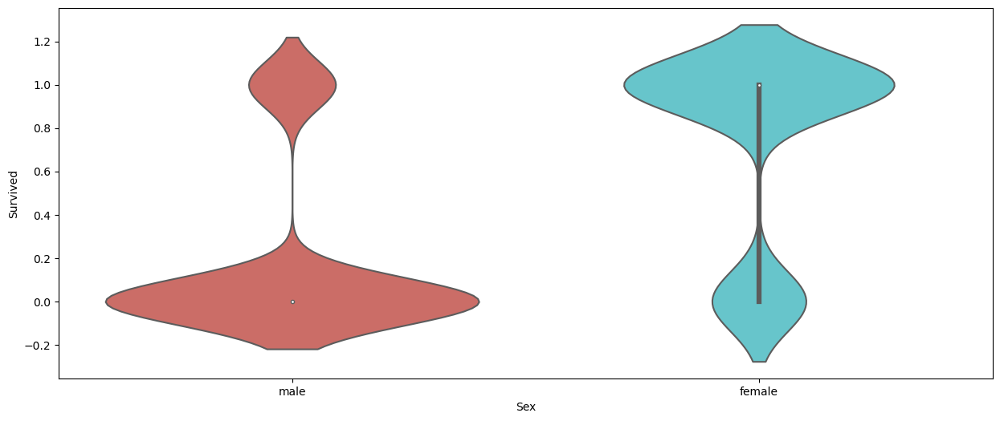

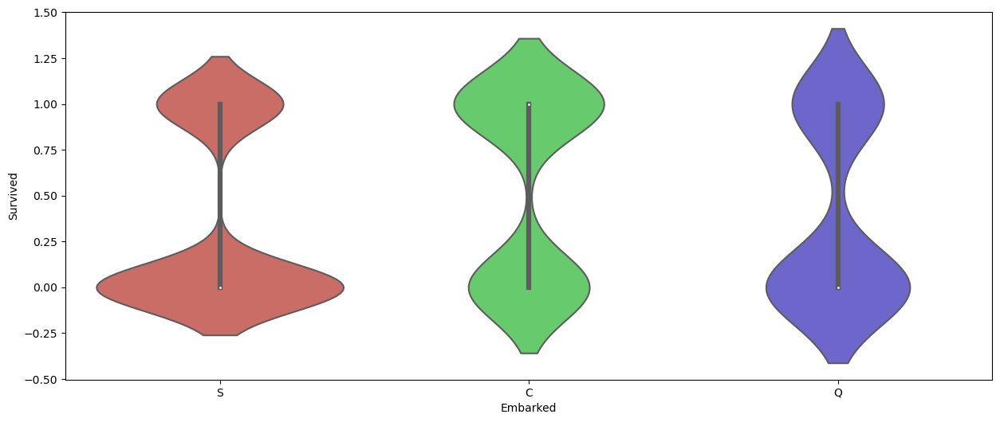

In [40]:
for j in object_columns:
    plt.figure(figsize=(15,6))
    sns.violinplot(x = df[j], y = df['Survived'], data = df, palette= 'hls')  
    plt.show()

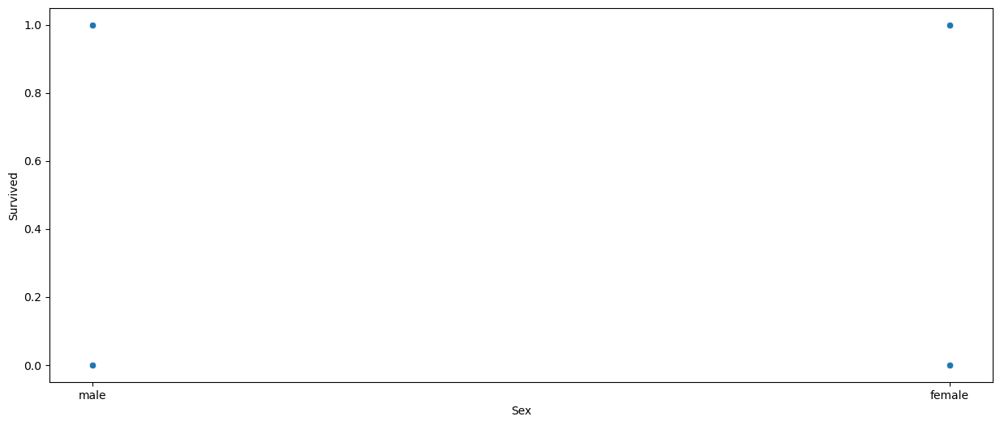

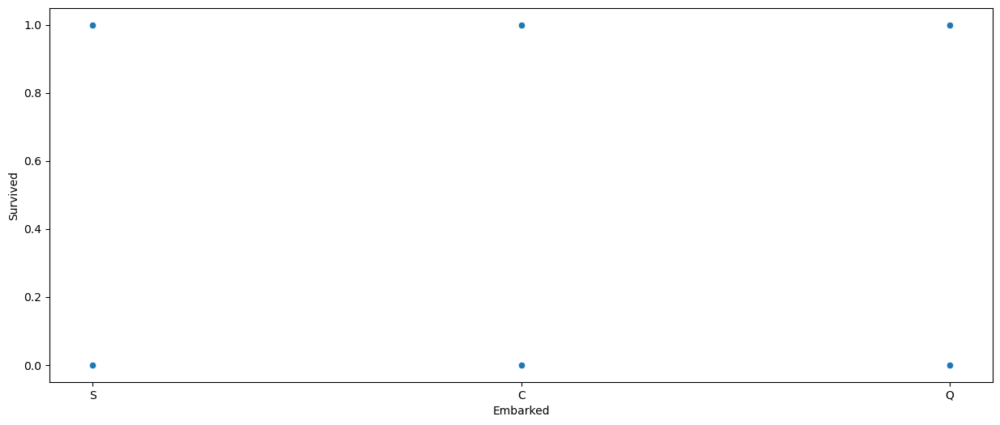

In [41]:
for j in object_columns:
    plt.figure(figsize=(15,6))
    sns.scatterplot(x = df[j], y = df['Survived'], data = df, palette= 'hls')  
    plt.show()

Count Plot


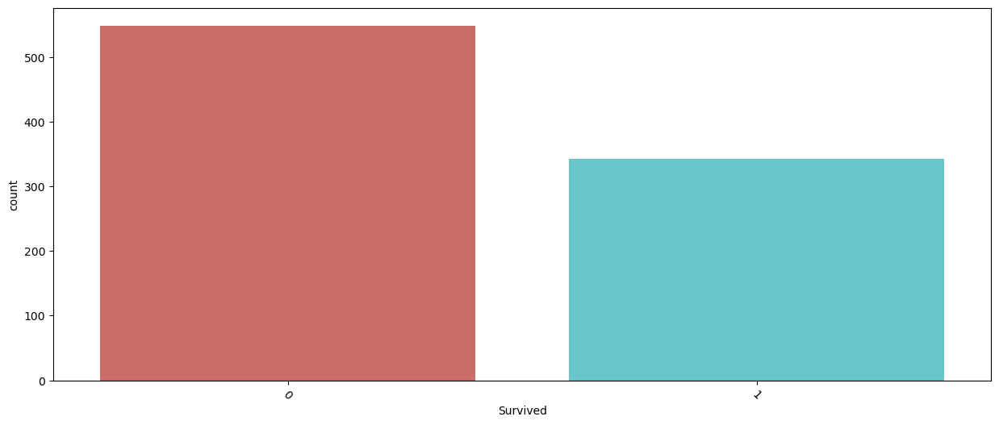

In [42]:
print("Count Plot")
plt.figure(figsize=(15,6))
sns.countplot(x ='Survived', data = df, palette = 'hls')
plt.xticks(rotation= -45)
plt.show()
print('\n')

In [43]:
for i in object_columns:
    print(i)
    print(df[i].unique())
    print('\n')

Sex
['male' 'female']


Embarked
['S' 'C' 'Q']




In [44]:
for i in object_columns:
    print(i)
    print(df[i].value_counts())
    print('\n')

Sex
Sex
male      577
female    314
Name: count, dtype: int64


Embarked
Embarked
S    646
C    168
Q     77
Name: count, dtype: int64




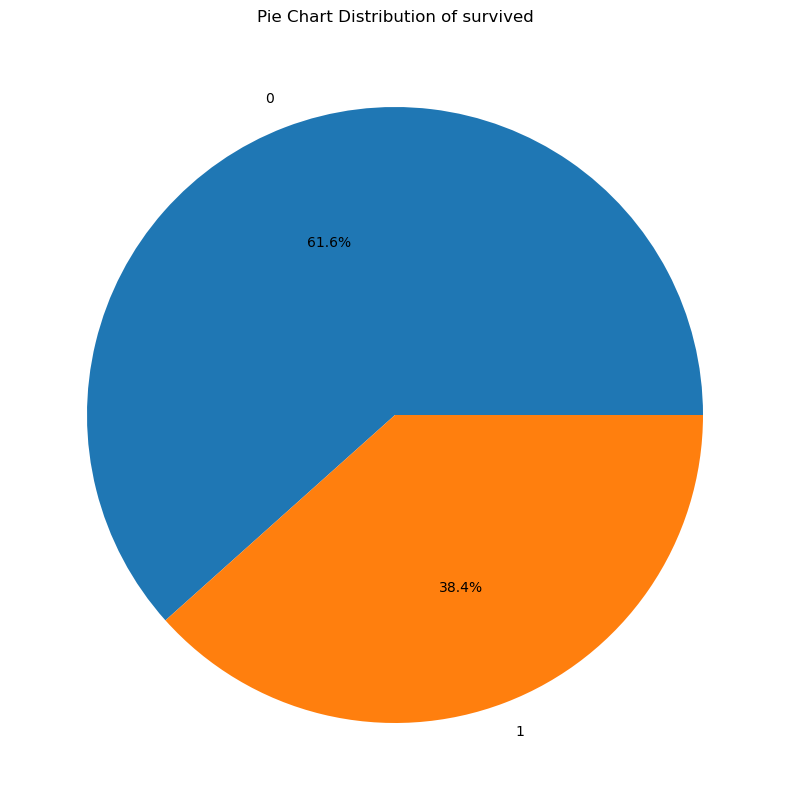

In [45]:
plt.figure(figsize=(20,10))
df['Survived'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Pie Chart Distribution of survived')
plt.ylabel('')
plt.show()
print('\n')

In [46]:
numerical_columns

['Survived', 'Pclass', 'Age', 'SibSp', 'Parch', 'Fare']

In [47]:
object_columns

['Sex', 'Embarked']

In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Sex       891 non-null    object 
 3   Age       891 non-null    float64
 4   SibSp     891 non-null    int64  
 5   Parch     891 non-null    int64  
 6   Fare      891 non-null    float64
 7   Embarked  891 non-null    object 
dtypes: float64(2), int64(4), object(2)
memory usage: 55.8+ KB


# Pivot Table

In [49]:
pd.pivot_table(df,index='Survived',values=['Pclass','Age','Parch','Fare','SibSp'])

,Age,Fare,Parch,Pclass,SibSp
Survived,,,,,
0,30.415100,22.117887,0.329690,2.531876,0.553734
1,28.549778,48.395408,0.464912,1.950292,0.473684


In [50]:
df_new = df.copy()

In [51]:
df_new.groupby('Pclass')['Age'].mean()

Pclass
1    37.048118
2    29.866958
3    26.403259
Name: Age, dtype: float64

In [52]:
df_new.groupby('Pclass')['Fare'].mean()

Pclass
1    84.154687
2    20.662183
3    13.675550
Name: Fare, dtype: float64

In [53]:
df_new.groupby('Sex')['Age'].mean()

Sex
female    28.216730
male      30.505824
Name: Age, dtype: float64

In [54]:
df = pd.get_dummies(df, columns=object_columns, drop_first=True)

In [55]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Survived    891 non-null    int64  
 1   Pclass      891 non-null    int64  
 2   Age         891 non-null    float64
 3   SibSp       891 non-null    int64  
 4   Parch       891 non-null    int64  
 5   Fare        891 non-null    float64
 6   Sex_male    891 non-null    bool   
 7   Embarked_Q  891 non-null    bool   
 8   Embarked_S  891 non-null    bool   
dtypes: bool(3), float64(2), int64(4)
memory usage: 44.5 KB


# Correlation

In [56]:
corr=df.corr()

In [57]:
corr

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_male,Embarked_Q,Embarked_S
Survived,1.000000,-0.338481,-0.069809,-0.035322,0.081629,0.257307,-0.543351,0.003650,-0.149683
Pclass,-0.338481,1.000000,-0.331339,0.083081,0.018443,-0.549500,0.131900,0.221009,0.074053
Age,-0.069809,-0.331339,1.000000,-0.232625,-0.179191,0.091566,0.084153,-0.013855,-0.019336
SibSp,-0.035322,0.083081,-0.232625,1.000000,0.414838,0.159651,-0.114631,-0.026354,0.068734
Parch,0.081629,0.018443,-0.179191,0.414838,1.000000,0.216225,-0.245489,-0.081228,0.060814
Fare,0.257307,-0.549500,0.091566,0.159651,0.216225,1.000000,-0.182333,-0.117216,-0.162184
Sex_male,-0.543351,0.131900,0.084153,-0.114631,-0.245489,-0.182333,1.000000,-0.074115,0.119224
Embarked_Q,0.003650,0.221009,-0.013855,-0.026354,-0.081228,-0.117216,-0.074115,1.000000,-0.499421
Embarked_S,-0.149683,0.074053,-0.019336,0.068734,0.060814,-0.162184,0.119224,-0.499421,1.000000


# Correlation Matrix

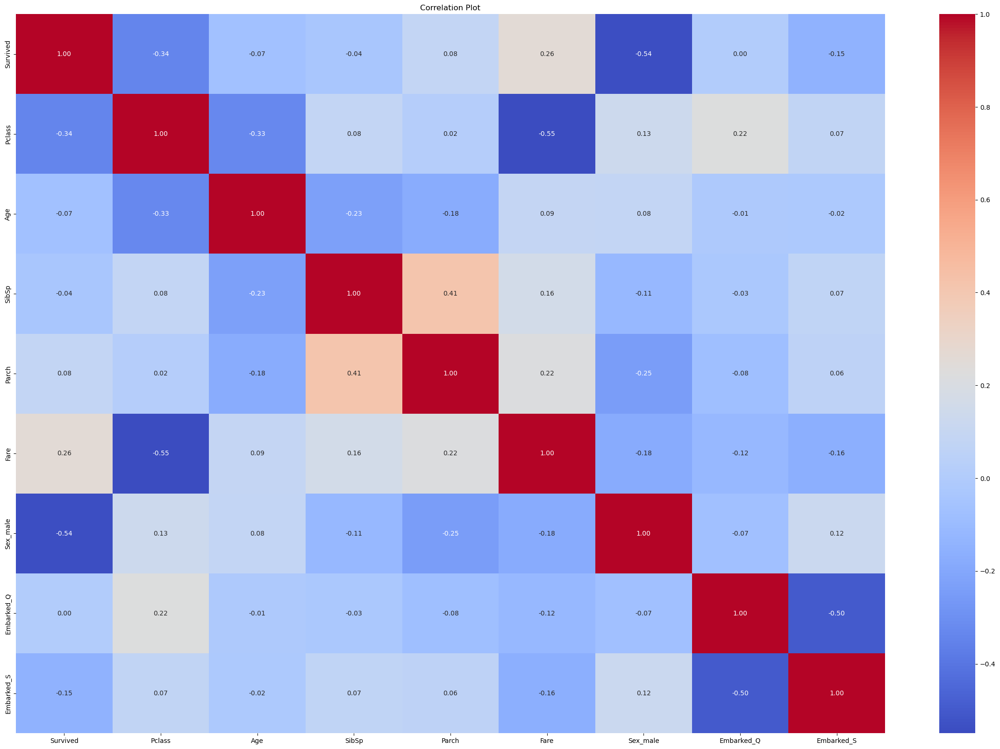

In [58]:
plt.figure(figsize=(30,20))
sns.heatmap(corr,annot=True,cmap='coolwarm',fmt=".2f")
plt.title('Correlation Plot')
plt.show()

In [59]:
correlation_threshold = 0.5

In [60]:
good_features = corr[corr['Survived'].abs() > correlation_threshold]['Survived'].index.tolist()

In [61]:
good_features.append('Survived')

In [62]:
df1 = corr[good_features]

In [63]:
df1


,Survived,Sex_male,Survived
Survived,1.000000,-0.543351,1.000000
Pclass,-0.338481,0.131900,-0.338481
Age,-0.069809,0.084153,-0.069809
SibSp,-0.035322,-0.114631,-0.035322
Parch,0.081629,-0.245489,0.081629
Fare,0.257307,-0.182333,0.257307
Sex_male,-0.543351,1.000000,-0.543351
Embarked_Q,0.003650,-0.074115,0.003650
Embarked_S,-0.149683,0.119224,-0.149683


In [64]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9 entries, Survived to Embarked_S
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  9 non-null      float64
 1   Sex_male  9 non-null      float64
 2   Survived  9 non-null      float64
dtypes: float64(3)
memory usage: 588.0+ bytes


In [65]:
columns_to_scale = ['Age','Fare']

In [66]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [67]:
df[columns_to_scale]= scaler.fit_transform(df[columns_to_scale])

In [68]:
df

,Survived,Pclass,Age,SibSp,Parch,Fare,Sex_male,Embarked_Q,Embarked_S
0,0,3,0.271174,1,0,0.014151,True,False,True
1,1,1,0.472229,1,0,0.139136,False,False,False
2,1,3,0.321438,0,0,0.015469,False,False,True
3,1,1,0.434531,1,0,0.103644,False,False,True
4,0,3,0.434531,0,0,0.015713,True,False,True
...,...,...,...,...,...,...,...,...,...
886,0,2,0.334004,0,0,0.025374,True,False,True
887,1,1,0.233476,0,0,0.058556,False,False,True
888,0,3,0.367921,1,2,0.045771,False,False,True
889,1,1,0.321438,0,0,0.058556,True,False,False


In [69]:
x = df.drop(['Survived'], axis = 1)
y = df['Survived']

In [70]:
print(x)
print('\n')
print(y)

     Pclass       Age  SibSp  Parch      Fare  Sex_male  Embarked_Q  \
0         3  0.271174      1      0  0.014151      True       False   
1         1  0.472229      1      0  0.139136     False       False   
2         3  0.321438      0      0  0.015469     False       False   
3         1  0.434531      1      0  0.103644     False       False   
4         3  0.434531      0      0  0.015713      True       False   
..      ...       ...    ...    ...       ...       ...         ...   
886       2  0.334004      0      0  0.025374      True       False   
887       1  0.233476      0      0  0.058556     False       False   
888       3  0.367921      1      2  0.045771     False       False   
889       1  0.321438      0      0  0.058556      True       False   
890       3  0.396833      0      0  0.015127      True        True   

     Embarked_S  
0          True  
1         False  
2          True  
3          True  
4          True  
..          ...  
886        True  
887

In [71]:
from sklearn.model_selection import train_test_split

In [72]:
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size=0.20,stratify=y,random_state=42)

In [73]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [74]:
logreg=LogisticRegression()

In [75]:
logreg.fit(X_train,y_train)

LogisticRegression()

In [76]:
y_pred=logreg.predict(X_test)

In [77]:
accuracy=accuracy_score(y_test,y_pred)
print("Accuracy:",accuracy)

Accuracy: 0.8044692737430168


In [78]:
from sklearn.tree import DecisionTreeClassifier
dr_model= DecisionTreeClassifier()
dr_model.fit(X_train,y_train)

DecisionTreeClassifier()

In [79]:
y_pred=dr_model.predict(X_test)

In [80]:
dt_score=accuracy_score(y_test,y_pred)

In [81]:
print(dt_score)

0.8100558659217877


In [82]:
from sklearn.ensemble import RandomForestClassifier

In [83]:
rf=RandomForestClassifier()

In [84]:
rf.fit(X_train,y_train)

RandomForestClassifier()

In [85]:
y_pred=rf.predict(X_test)

In [86]:
from sklearn.metrics import accuracy_score

#precision=TP/(TP+FP)
#F1 SCORE=Harmonic mean of precision and recall
#(1/F1)=(1/P1)+(1/R1)
#Recall=
#F1 score=2*(precision*recall)/(precision+recall)

In [87]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix

In [88]:
f1=f1_score(y_test,y_pred)
print(f1)

0.7424242424242424


In [89]:
cm=confusion_matrix(y_test,y_pred)
print(cm)

[[96 14]
 [20 49]]


In [90]:
ps=precision_score(y_test,y_pred)
print(ps)

0.7777777777777778


In [91]:
rs=recall_score(y_test,y_pred)
print(rs)

0.7101449275362319


In [92]:
cr=classification_report(y_test,y_pred)
print(cr)

              precision    recall  f1-score   support

           0       0.83      0.87      0.85       110
           1       0.78      0.71      0.74        69

    accuracy                           0.81       179
   macro avg       0.80      0.79      0.80       179
weighted avg       0.81      0.81      0.81       179

